# Data Figures for Paper

```
Auth: Joshua Pickard
      jpic@umich.edu
Date: September 24, 2024

# Set up

In [1]:
import os
import sys
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from matplotlib.patches import Circle, RegularPolygon
from matplotlib.path import Path
from matplotlib.projections import register_projection
from matplotlib.projections.polar import PolarAxes
from matplotlib.spines import Spine
from matplotlib.transforms import Affine2D

from openai import OpenAI
from sklearn.decomposition import PCA
import umap


from BRAD import llms
llms.load_openai()

datapath = "/nfs/turbo/umms-indikar/shared/projects/RAG/dataInPaper/"

Enter your Open AI API key:  ········


In [1]:
def radar_factory(num_vars, frame='circle'):
    """
    Create a radar chart with `num_vars` Axes.

    This function creates a RadarAxes projection and registers it.

    Parameters
    ----------
    num_vars : int
        Number of variables for radar chart.
    frame : {'circle', 'polygon'}
        Shape of frame surrounding Axes.

    """
    # calculate evenly-spaced axis angles
    theta = np.linspace(0, 2*np.pi, num_vars, endpoint=False)

    class RadarTransform(PolarAxes.PolarTransform):

        def transform_path_non_affine(self, path):
            # Paths with non-unit interpolation steps correspond to gridlines,
            # in which case we force interpolation (to defeat PolarTransform's
            # autoconversion to circular arcs).
            if path._interpolation_steps > 1:
                path = path.interpolated(num_vars)
            return Path(self.transform(path.vertices), path.codes)

    class RadarAxes(PolarAxes):

        name = 'radar'
        PolarTransform = RadarTransform

        def __init__(self, *args, **kwargs):
            super().__init__(*args, **kwargs)
            # rotate plot such that the first axis is at the top
            self.set_theta_zero_location('N')

        def fill(self, *args, closed=True, **kwargs):
            """Override fill so that line is closed by default"""
            return super().fill(closed=closed, *args, **kwargs)

        def plot(self, *args, **kwargs):
            """Override plot so that line is closed by default"""
            lines = super().plot(*args, **kwargs)
            for line in lines:
                self._close_line(line)

        def _close_line(self, line):
            x, y = line.get_data()
            # FIXME: markers at x[0], y[0] get doubled-up
            if x[0] != x[-1]:
                x = np.append(x, x[0])
                y = np.append(y, y[0])
                line.set_data(x, y)

        def set_varlabels(self, labels):
            self.set_thetagrids(np.degrees(theta), labels)

        def _gen_axes_patch(self):
            # The Axes patch must be centered at (0.5, 0.5) and of radius 0.5
            # in axes coordinates.
            if frame == 'circle':
                return Circle((0.5, 0.5), 0.5)
            elif frame == 'polygon':
                return RegularPolygon((0.5, 0.5), num_vars,
                                      radius=.5, edgecolor="k")
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

        def _gen_axes_spines(self):
            if frame == 'circle':
                return super()._gen_axes_spines()
            elif frame == 'polygon':
                # spine_type must be 'left'/'right'/'top'/'bottom'/'circle'.
                spine = Spine(axes=self,
                              spine_type='circle',
                              path=Path.unit_regular_polygon(num_vars))
                # unit_regular_polygon gives a polygon of radius 1 centered at
                # (0, 0) but we want a polygon of radius 0.5 centered at (0.5,
                # 0.5) in axes coordinates.
                spine.set_transform(Affine2D().scale(.5).translate(.5, .5)
                                    + self.transAxes)
                return {'polar': spine}
            else:
                raise ValueError("Unknown value for 'frame': %s" % frame)

    register_projection(RadarAxes)
    return theta

# Big Figure all together

/tmp/ipykernel_4044252/2235346960.py:61: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/2235346960.py:61: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/2235346960.py:62: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/2235346960.py:62: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_correctness', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/2235346960.py:63: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` 

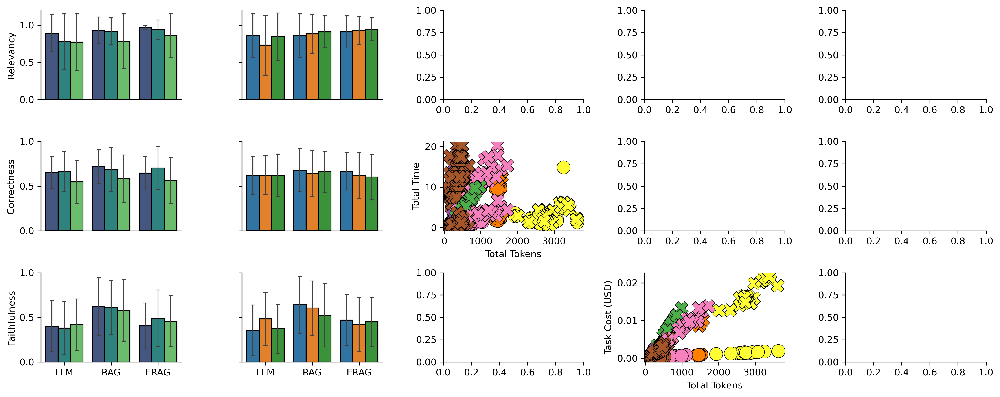

<Figure size 640x480 with 0 Axes>

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is already defined and contains the necessary data

fig, axs = plt.subplots(3, 5, figsize=(15, 6), dpi=300)


########################################################
#                       BAR PLOTS
########################################################

df = pd.read_csv(os.path.join(datapath, "jpic_ragas_9_24_2024.csv"))
df = df.drop_duplicates()
qdf = pd.read_csv(os.path.join(datapath, "machoi_labeled_ds.csv"))
qdf = qdf[['question', 'question type']]
question_types = []
for q in df['question']:
    index = qdf[qdf['question'] == q].index
    q_type = qdf['question type'].iloc[index[0]] if not index.empty else None
    question_types.append(q_type)
df['Question Type'] = question_types
df['Question Type'] = df['Question Type'].replace({
    'simple' : 'Simple',
    'multi_context' : 'Multi-context'
})
df['Parameters'] = df['Parameters'].replace({
    'No DB': 'LLM',
    'RAG, Compression': 'ERAG',
})
df

# Remove the individual legends from the subplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'viridis',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'tab10',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
sns.barplot(y='answer_correctness', ax=axs[1, 0], **barplot_kwargs)
sns.barplot(y='answer_relevancy', ax=axs[0, 1], **barplot_kwargs_2)
sns.barplot(y='answer_correctness', ax=axs[1, 1], **barplot_kwargs_2)

# Set legend = True for the third row plots
barplot_kwargs['legend'] = True
barplot_kwargs_2['legend'] = True

sns.barplot(y='faithfulness', ax=axs[2, 0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[2, 1], **barplot_kwargs_2)

# Create a single figure legend for the entire figure
# Get handles and labels from both 'Question Type' and 'Label'
handles_1, labels_1 = axs[2, 0].get_legend_handles_labels()
handles_2, labels_2 = axs[2, 1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Remove individual subplot legends to avoid overlap
axs[2, 0].legend_.remove()
axs[2, 1].legend_.remove()

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Set y-limits and y-ticks
axs[0, 0].set_ylim([0, 1.2])
axs[0, 1].set_ylim([0, 1.2])
axs[1, 0].set_ylim([0, 1])
axs[1, 1].set_ylim([0, 1])
axs[2, 0].set_ylim([0, 1])
axs[2, 1].set_ylim([0, 1])
axs[0, 0].set_yticks([0, 0.5, 1])
axs[1, 0].set_yticks([0, 0.5, 1])
axs[2, 0].set_yticks([0, 0.5, 1])
axs[0, 1].set_yticks([0, 0.5, 1], labels=[])
axs[1, 1].set_yticks([0, 0.5, 1], labels=[])
axs[2, 1].set_yticks([0, 0.5, 1], labels=[])
axs[0, 1].set_ylabel(None)
axs[1, 1].set_ylabel(None)
axs[2, 1].set_ylabel(None)

axs[0,0].set_ylabel("Relevancy")
axs[1,0].set_ylabel("Correctness")
axs[2,0].set_ylabel("Faithfulness")
axs[2,0].set_xlabel("")
axs[2,1].set_xlabel("")
axs[1,0].set_xlabel("")
axs[1,1].set_xlabel("")
axs[0,0].set_xlabel("")
axs[0,1].set_xlabel("")
axs[0,0].set_xticks([])
axs[0,1].set_xticks([])
axs[1,0].set_xticks([])
axs[1,1].set_xticks([])


########################################################
#                       PAIR PLOT
########################################################

df = pd.read_csv(os.path.join(datapath, "jpic_brad_profile.csv"))
log_df = df.drop(['Unnamed: 0'], axis=1)

# Variables for the pairplot
plot_vars = ['Total Tokens', 'Task Time', 'Total Cost (USD)']


sns.scatterplot(
    data=log_df,
    x = 'Total Tokens',
    y = 'Total Time',
    hue='Task',
    s= 200,       # Marker size
    edgecolor= 'black',  # Black edges around points
    linewidth= 0.5,
    style = 'Model',
    palette='Set1',
    ax = axs[1,2],
    legend=False
)
sns.scatterplot(
    data=log_df,
    x = 'Total Tokens',
    y = 'Task Time',
    hue='Task',
    s= 200,       # Marker size
    edgecolor= 'black',  # Black edges around points
    linewidth= 0.5,
    style = 'Model',
    palette='Set1',
    ax = axs[1,2],
    legend=False
)
sns.scatterplot(
    data=log_df,
    x = 'Total Tokens',
    y = 'Task Cost (USD)',
    hue='Task',
    s= 200,       # Marker size
    edgecolor= 'black',  # Black edges around points
    linewidth= 0.5,
    style = 'Model',
    palette='Set1',
    ax = axs[2,3],
    legend=False
)

sns.despine()

# Improve layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


# Despine and adjust layout
sns.despine()
plt.tight_layout()

# Save the main figure to a PDF
# fig.savefig('bmk_main_figure.pdf')
# Now, create a separate figure for the legend
# legend_fig, legend_ax = plt.subplots(figsize=(4, 3), dpi=300)
# legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=10, title="", title_fontsize=12)
# legend_ax.axis('off')  # Hide the axis in the legend figure
# Adjust layout for the legend and save it to a PDF
# plt.tight_layout()
# legend_fig.savefig('bmk_legend_figure.pdf')
# Display the figures
# plt.show()


In [46]:
log_df

,Model,Module,Total Time,Parameters,Task,Task Time,Input Tokens,Output Tokens,Total Tokens,Task Cost (USD),Total Cost (USD)
0,gpt-3.5-turbo-0125,DATABASE,2.055127,DATABASE,Select database,0.873842,427.0,51.0,478.0,0.000290,0.000290
1,gpt-3.5-turbo-0125,DATABASE,2.044675,DATABASE,Select database,0.928157,429.0,51.0,480.0,0.000291,0.000291
2,gpt-3.5-turbo-0125,DATABASE,1.943434,DATABASE,Select database,0.852115,427.0,51.0,478.0,0.000290,0.000290
3,gpt-3.5-turbo-0125,DATABASE,1.924876,DATABASE,Select database,0.774714,427.0,52.0,479.0,0.000291,0.000291
4,gpt-3.5-turbo-0125,DATABASE,2.357032,DATABASE,Select database,1.258245,425.0,50.0,475.0,0.000287,0.000287
...,...,...,...,...,...,...,...,...,...,...,...
824,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,0.364309,403.0,1.0,404.0,0.002030,0.038485
825,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,0.991231,463.0,1.0,464.0,0.002330,0.038485
826,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,1.886669,367.0,115.0,482.0,0.003560,0.038485
827,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,1.145913,391.0,71.0,462.0,0.003020,0.038485


# UMAP of Questions and Database

In [86]:
def get_embedding(text, model="text-embedding-3-small"):
   text = text.replace("\n", " ")
   return client.embeddings.create(input = [text], model=model).data[0].embedding

# This file path is hardcoded. It contains the pdf versions of the papers found here: https://rajapakse.lab.medicine.umich.edu/papers/digital-library
filepath = "/nfs/turbo/umms-indikar/shared/projects/RAG/papers/Digital_Library_18_Sep_2024"

client = OpenAI()
files = [os.path.join(filepath, file) for file in os.listdir(filepath) if os.path.isfile(os.path.join(filepath, file))]
for i, file in enumerate(files):
    files[i] = file.split('/')[-1]

df = pd.DataFrame({'File': files})
df['ada_embedding'] = df['File'].apply(lambda x: get_embedding(x, model='text-embedding-3-small'))


In [3]:
# Function to categorize based on file name
def categorize_file(file_name):
    file_name_lower = file_name.lower()
    for category, keywords in categories.items():
        if any(keyword in file_name_lower for keyword in keywords):
            return category
    return 'other'  # Default category if no match

# Define categories and keywords
categories = {
    'biology': ['wound healing', 'brain', 'ctcf', 'ismara', 'epidemics', 'epidemic', 'hi-c', 'assay', 'strand', 'cell', 'gene', 'protein', 'dna', 'chromosome', 'reprogramming', 'omics', 'sequencing', 'cancer', 'bio', 'human', 'genome', 'fibroblast', 'rna', 'weintraub', 'tumour'],
    'computing': ['optimal', 'matrices', 'robot', 'matcon', 'principal', 'centrality', 'simplicial', 'algorithm', 'neural', 'network', 'dimension', 'machine', 'tensor', 'kronecker', 'hypergraph', 'control', 'embedding', 'data', 'pagerank', 'decomposition', 'compressed sensing', 'physics'],
    'mathematics': ['dynamics', 'global', 'attractor', 'emerging', 'divergence', 'n-torus', 'theory', 'pbh', 'robustness', 'bifurcation', 'dynamical', 'SVD', 'matrix', 'hypergraph', 'graph', 'hardy', 'eigenvalue', 'mathematics', 'oscillator', 'smale', 'geometric', 'morse', 'math', 'differential', 'topology']
    # Add more categories as needed
}

# Apply categorization to the file names
df['Category'] = df['File'].apply(categorize_file)


In [4]:
df['Type'] = 'Document'
df

,File,ada_embedding,Category,Type
0,epigenetic memory in the context of nuclear re...,"[0.02840851992368698, 0.023417184129357338, 0....",biology,Document
1,effective graph resistance.pdf,"[0.0051189265213906765, 0.018084699288010597, ...",mathematics,Document
2,the laplacian of a hypergraph.pdf,"[-0.034061238169670105, -0.014126780442893505,...",computing,Document
3,hardy’s “small” discovery remembered.pdf,"[0.02294829860329628, -0.010527572594583035, 0...",mathematics,Document
4,generative hypergraph clustering from blockmod...,"[-0.004676940385252237, 0.01491972990334034, 0...",biology,Document
...,...,...,...,...
514,umap uniform manifold approximation and projec...,"[-0.029548123478889465, 0.020546089857816696, ...",computing,Document
515,integrating microarray-based spatial transcrip...,"[0.011692981235682964, -0.009666702710092068, ...",biology,Document
516,long-term association of a transcription facto...,"[0.011860456317663193, 0.00816251989454031, 0....",biology,Document
517,string v11 protein–protein association network...,"[-0.014848146587610245, -0.017734957858920097,...",biology,Document


In [5]:
qdf = pd.read_csv("/nfs/turbo/umms-indikar/shared/projects/RAG/RAGAS2/machoi_labeled_ds.csv")
qdf = qdf[['question', 'Computer Science', 'Mathematics', 'Biology']]
qdf['Category'] = qdf[['Computer Science', 'Mathematics', 'Biology']].idxmax(axis=1)
qdf = qdf.drop(['Computer Science', 'Mathematics', 'Biology'], axis=1)

#TODO: in the label, change "Computer Science" to "computing" and make all lowercase
qdf['Category'] = qdf['Category'].replace({'Computer Science': 'computing'}).str.lower()
qdf

client = OpenAI()
files = list(qdf['question'])
for i, file in enumerate(files):
    files[i] = file

qdf['ada_embedding'] = qdf['question'].apply(lambda x: get_embedding(x, model='text-embedding-3-small'))
qdf['Type'] = 'Question'
qdf

,question,Category,ada_embedding,Type
0,How do B cells undergo affinity maturation dur...,biology,"[0.007896125316619873, 0.032746393233537674, 0...",Question
1,How is the timely clearance of neutrophils cri...,biology,"[-0.002529786666855216, 0.039062343537807465, ...",Question
2,How did Levinson and Smith use the method of p...,mathematics,"[0.06435906141996384, -0.009188005700707436, -...",Question
3,What steps were involved in the PacBio library...,biology,"[0.013098652474582195, -0.004243963398039341, ...",Question
4,How does Morse theory relate to the number of ...,mathematics,"[0.007668609265238047, 0.01687438227236271, 0....",Question
...,...,...,...,...
508,What advantage does CD9 offer in isolating mur...,biology,"[0.03615999221801758, -0.043701253831386566, 0...",Question
509,How is a rewriting event in GNA models defined...,mathematics,"[-0.003302224213257432, 0.04525971785187721, 0...",Question
510,How is fresh frozen tissue fixed with Formalde...,biology,"[-0.007637961767613888, 0.003258615732192993, ...",Question
511,What causes unexplained stock market fluctuati...,computing,"[0.017660122364759445, -0.03757745772600174, 0...",Question


In [6]:
qdf['Files'] = files
qdf

,question,Category,ada_embedding,Type,Files
0,How do B cells undergo affinity maturation dur...,biology,"[0.007896125316619873, 0.032746393233537674, 0...",Question,How do B cells undergo affinity maturation dur...
1,How is the timely clearance of neutrophils cri...,biology,"[-0.002529786666855216, 0.039062343537807465, ...",Question,How is the timely clearance of neutrophils cri...
2,How did Levinson and Smith use the method of p...,mathematics,"[0.06435906141996384, -0.009188005700707436, -...",Question,How did Levinson and Smith use the method of p...
3,What steps were involved in the PacBio library...,biology,"[0.013098652474582195, -0.004243963398039341, ...",Question,What steps were involved in the PacBio library...
4,How does Morse theory relate to the number of ...,mathematics,"[0.007668609265238047, 0.01687438227236271, 0....",Question,How does Morse theory relate to the number of ...
...,...,...,...,...,...
508,What advantage does CD9 offer in isolating mur...,biology,"[0.03615999221801758, -0.043701253831386566, 0...",Question,What advantage does CD9 offer in isolating mur...
509,How is a rewriting event in GNA models defined...,mathematics,"[-0.003302224213257432, 0.04525971785187721, 0...",Question,How is a rewriting event in GNA models defined...
510,How is fresh frozen tissue fixed with Formalde...,biology,"[-0.007637961767613888, 0.003258615732192993, ...",Question,How is fresh frozen tissue fixed with Formalde...
511,What causes unexplained stock market fluctuati...,computing,"[0.017660122364759445, -0.03757745772600174, 0...",Question,What causes unexplained stock market fluctuati...


In [7]:
merged_df = pd.concat([qdf[['Category', 'ada_embedding', 'Type']], df[['Category', 'ada_embedding', 'Type']]], ignore_index=True)
merged_df

,Category,ada_embedding,Type
0,biology,"[0.007896125316619873, 0.032746393233537674, 0...",Question
1,biology,"[-0.002529786666855216, 0.039062343537807465, ...",Question
2,mathematics,"[0.06435906141996384, -0.009188005700707436, -...",Question
3,biology,"[0.013098652474582195, -0.004243963398039341, ...",Question
4,mathematics,"[0.007668609265238047, 0.01687438227236271, 0....",Question
...,...,...,...
1027,computing,"[-0.029548123478889465, 0.020546089857816696, ...",Document
1028,biology,"[0.011692981235682964, -0.009666702710092068, ...",Document
1029,biology,"[0.011860456317663193, 0.00816251989454031, 0....",Document
1030,biology,"[-0.014848146587610245, -0.017734957858920097,...",Document


In [94]:
text = list(qdf['question'].values) + list(df['File'].values)
merged_df['text'] = text

In [95]:
merged_df.to_csv(os.path.join(datapath, "RAG_database_embeddings.csv"))

In [99]:
merged_df['ada_embedding']

0       0.007896125316619873 0.032746393233537674 0.01...
1       -0.002529786666855216 0.039062343537807465 0.0...
2       0.06435906141996384 -0.009188005700707436 -0.0...
3       0.013098652474582195 -0.004243963398039341 0.0...
4       0.007668609265238047 0.01687438227236271 0.004...
                              ...                        
1027    -0.029548123478889465 0.020546089857816696 0.0...
1028    0.011692981235682964 -0.009666702710092068 0.0...
1029    0.011860456317663193 0.00816251989454031 0.046...
1030    -0.014848146587610245 -0.017734957858920097 0....
1031    0.02614767663180828 0.02112532965838909 0.0521...
Name: ada_embedding, Length: 1032, dtype: object

## Load Embeddings

In [77]:
import ast
# Function to convert string of list of numbers into a string of numbers
def format_embedding(embedding_str):
    # Convert the string representation of a list into an actual list using ast.literal_eval
    number_list = ast.literal_eval(embedding_str)
    # Join the numbers into a single string separated by spaces
    return ' '.join(map(str, number_list))

def convert_strings_to_floats(input_array):
    output_array = []
    for element in input_array:
        converted_float = float(element)
        output_array.append(converted_float)
    return output_array
    
merged_df = pd.read_csv(os.path.join(datapath, "RAG_database_embeddings.csv"))
embs = []
for i in range(merged_df.shape[0]):
    embs.append(convert_strings_to_floats(merged_df['ada_embedding'].values[i].split()))
    
# Apply the function to the 'ada_embedding' column
merged_df['ada_embedding'] = embs # merged_df['ada_embedding'].apply(format_embedding)

In [78]:
embeddings = []
for i in range(merged_df.shape[0]):
    embeddings.append((merged_df['ada_embedding'].values[i])) #.split()))
embeddings = np.array(embeddings)
print(f"{embeddings.shape=}")

embeddings.shape=(1032, 1536)


In [79]:
# Perform UMAP for 2D visualization
umap_model = umap.UMAP(n_components=2, random_state=0)
umap_embeddings = umap_model.fit_transform(embeddings)

# Add the UMAP results to the DataFrame for visualization
merged_df['UMAP1'] = umap_embeddings[:, 0]
merged_df['UMAP2'] = umap_embeddings[:, 1]

# Capitalize the first letter of each category for the legend
merged_df['Category'] = merged_df['Category'].str.title()

/home/jpic/.local/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


## Embeddings with Titles

In [112]:
merged_df

,Unnamed: 0.1,Unnamed: 0,Category,ada_embedding,Type,UMAP1,UMAP2,text
0,0,0,Biology,"[0.007896125316619873, 0.032746393233537674, 0...",Question,7.236590,5.024784,How do B cells undergo affinity maturation dur...
1,1,1,Biology,"[-0.002529786666855216, 0.039062343537807465, ...",Question,6.957964,5.711449,How is the timely clearance of neutrophils cri...
2,2,2,Mathematics,"[0.06435906141996384, -0.009188005700707436, -...",Question,12.655596,6.513789,How did Levinson and Smith use the method of p...
3,3,3,Biology,"[0.013098652474582195, -0.004243963398039341, ...",Question,7.497985,3.200835,What steps were involved in the PacBio library...
4,4,4,Mathematics,"[0.007668609265238047, 0.01687438227236271, 0....",Question,14.179707,5.541684,How does Morse theory relate to the number of ...
...,...,...,...,...,...,...,...,...
1027,1027,1027,Computing,"[-0.029548123478889465, 0.020546089857816696, ...",Document,12.789261,1.964272,umap uniform manifold approximation and projec...
1028,1028,1028,Biology,"[0.011692981235682964, -0.009666702710092068, ...",Document,7.988803,2.133732,integrating microarray-based spatial transcrip...
1029,1029,1029,Biology,"[0.011860456317663193, 0.00816251989454031, 0....",Document,6.302783,2.021999,long-term association of a transcription facto...
1030,1030,1030,Biology,"[-0.014848146587610245, -0.017734957858920097,...",Document,6.985845,2.634417,string v11 protein–protein association network...


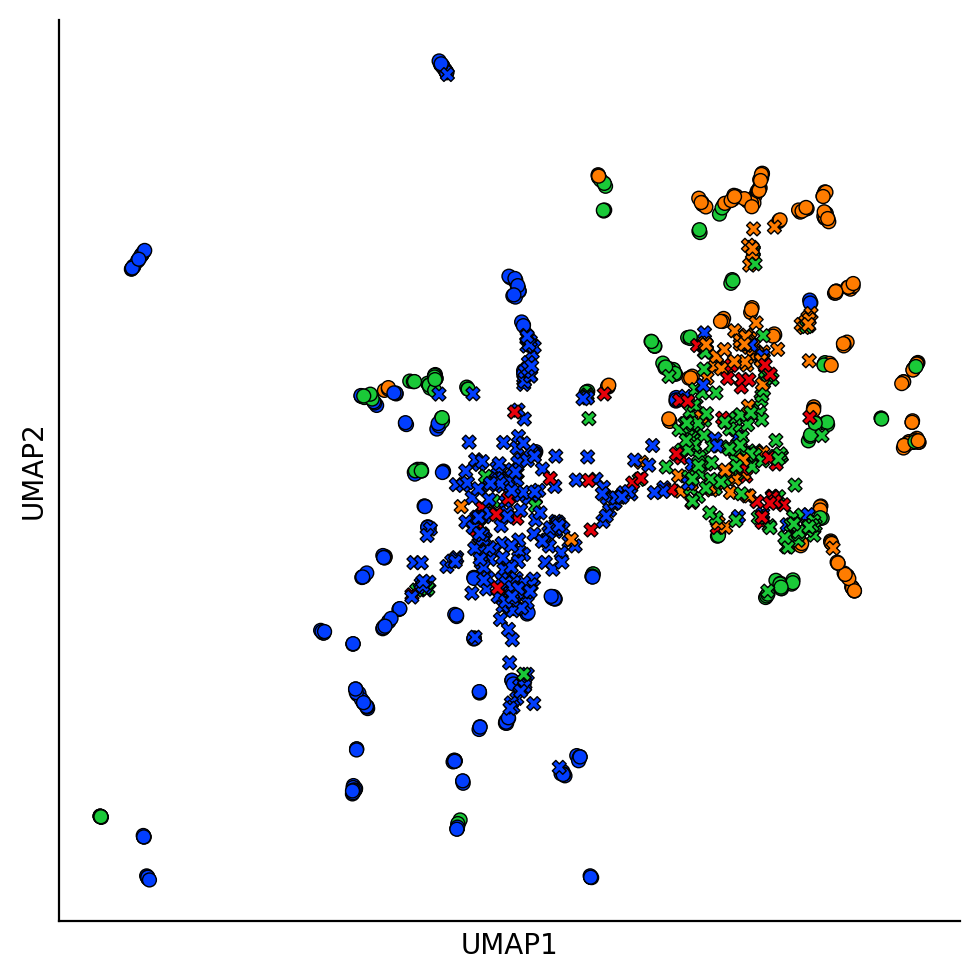

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming 'merged_df' is already defined
# random_state=0 for reproducibility
plt.figure(figsize=(5, 5), dpi=200)  # Equal size for both axes

# Create the scatter plot
sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=merged_df, 
    s=25,                    # Marker size
    edgecolor='black',        # Black edge for markers
    linewidth=0.5,            # Line width for marker edges
    hue='Category',           # Color by capitalized category
    style='Type',             # Marker style based on 'Type'
    palette='bright',          # Distinct color palette
    legend=False              # No legend
)

plt.xticks([])  # Remove x-axis ticks
plt.yticks([])  # Remove y-axis ticks

# Remove the spines for a clean look
sns.despine()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_471874/3645943125.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_points['TEXT1'] = sampled_points['UMAP1']
/tmp/ipykernel_471874/3645943125.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_points['TEXT2'] = sampled_points['UMAP2']
/tmp/ipykernel_471874/3645943125.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#

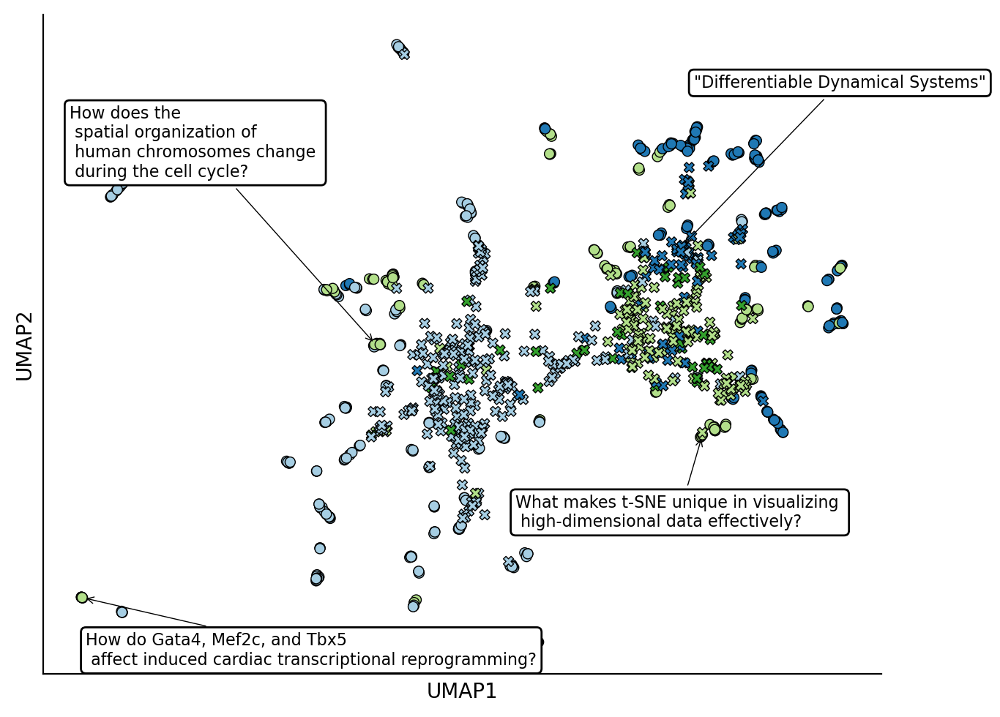

In [188]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming 'merged_df' is already defined
# random_state=0 for reproducibility
plt.figure(figsize=(7, 5), dpi=200)  # Equal size for both axes

# Create the scatter plot
sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=merged_df, 
    s=25,                    # Marker size
    edgecolor='black',        # Black edge for markers
    linewidth=0.5,            # Line width for marker edges
    hue='Category',           # Color by capitalized category
    style='Type',             # Marker style based on 'Type'
    palette='Paired',          # Distinct color palette
    legend=False              # No legend
)

# Sample 10 random rows to annotate
idxs = [969, 439, 238, 23]
sampled_points = merged_df.iloc[idxs] # merged_df.sample(10, random_state=0)
sampled_points['TEXT1'] = sampled_points['UMAP1']
sampled_points['TEXT2'] = sampled_points['UMAP2']
sampled_points['TEXT2'].iloc[0] = 8
sampled_points['TEXT2'].iloc[1] = -1
sampled_points['TEXT1'].iloc[1] = 8
sampled_points['TEXT2'].iloc[2] = -3
sampled_points['TEXT1'].iloc[3] = -2
sampled_points['TEXT2'].iloc[3] = 6

# Annotate the selected points with arrows pointing to the markers
ctr = 0
for _, row in sampled_points.iterrows():
    text = row['text']
    if text.endswith(".pdf"):
        text = text[:-4]
        text = " ".join([x.capitalize() for x in text.split(' ')])
        text = '"' + text + '"'
    if ctr < 3:
        if len(text.split()) > 6:
            text = " ".join(text.split()[:6] + ["\n"] + text.split()[6:])
    elif ctr==3:
        text = " ".join(text.split()[:3] + ["\n"] + text.split()[3:6]  + ["\n"] + text.split()[6:9] + ["\n"] + text.split()[9:])
#    print(row)
    plt.annotate(
        text=text,  # Text to display
        xy=(row['UMAP1'], row['UMAP2']),  # Point to annotate
        xytext=(row['TEXT1'] + np.random.uniform(-0.5, 0.5),  # Shift text a little
                row['TEXT2'] + np.random.uniform(-0.5, 0.5)),
        arrowprops=dict(facecolor='black', arrowstyle="->", lw=0.5),  # Arrow pointing to the point
        fontsize=8,  # Font size for the annotation
        bbox=dict(boxstyle="round,pad=0.3", edgecolor="black", facecolor="white")  # Box around the text
    )
    ctr += 1

plt.xticks([])  # Remove x-axis ticks
plt.yticks([])  # Remove y-axis ticks

# Remove the spines for a clean look
sns.despine()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [174]:
merged_df[merged_df['UMAP1'] < 0][merged_df['UMAP2'] < 0] # .shape


/tmp/ipykernel_471874/3672433054.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  merged_df[merged_df['UMAP1'] < 0][merged_df['UMAP2'] < 0] # .shape


,Unnamed: 0.1,Unnamed: 0,Category,ada_embedding,Type,UMAP1,UMAP2,text
67,67,67,Biology,"[0.02112824097275734, -0.020032020285725594, 0...",Question,-1.748011,-2.053961,"How do Gata4, Mef2c, and Tbx5 affect induced c..."
87,87,87,Computing,"[0.016889089718461037, -0.024890366941690445, ...",Question,-1.756953,-2.048981,How do transcription factors affect cardiac re...
126,126,126,Biology,"[0.02514374442398548, 0.02855267934501171, 0.0...",Question,-0.767272,-2.910562,What defines a true somatic stem cell in terms...
128,128,128,Biology,"[0.013032271526753902, -0.0039855423383414745,...",Question,-0.830241,-2.340073,How do Wnts affect somite patterning in myogen...
129,129,129,Biology,"[0.033272188156843185, 0.009926318190991879, 0...",Question,-0.833234,-2.347142,How do Wnt proteins affect somite cell commitm...
134,134,134,Computing,"[0.01634369045495987, -0.02000086009502411, 0....",Question,-1.729471,-2.066935,"How do Gata4, Mef2c, and Tbx5 affect induced c..."
159,159,159,Biology,"[0.011972819454967976, 0.002431978937238455, 0...",Question,-0.743668,-2.942141,How do aged HSCs compare to younger HSCs in te...
238,238,238,Biology,"[0.02112824097275734, -0.020032020285725594, 0...",Question,-1.740051,-2.058166,"How do Gata4, Mef2c, and Tbx5 affect induced c..."
258,258,258,Computing,"[0.016889089718461037, -0.024890366941690445, ...",Question,-1.752813,-2.051677,How do transcription factors affect cardiac re...
297,297,297,Biology,"[0.02514374442398548, 0.02855267934501171, 0.0...",Question,-0.744909,-2.926253,What defines a true somatic stem cell in terms...


In [167]:
sampled_points

,Unnamed: 0.1,Unnamed: 0,Category,ada_embedding,Type,UMAP1,UMAP2,text,TEXT1,TEXT2
969,969,969,Mathematics,"[0.02773440070450306, 0.015058205462992191, -0...",Document,11.953926,4.854609,differentiable dynamical systems.pdf,11.953926,8.0
439,439,439,Computing,"[-0.046222999691963196, -0.02139446511864662, ...",Question,12.427408,1.148024,What makes t-SNE unique in visualizing high-di...,12.427408,-1.0
238,238,238,Biology,"[0.02112824097275734, -0.020032020285725594, 0...",Question,-1.740051,-2.058166,"How do Gata4, Mef2c, and Tbx5 affect induced c...",-1.740051,-3.0
23,23,23,Biology,"[0.0464804582297802, 0.004646355286240578, 0.0...",Question,4.966411,2.920830,How does the spatial organization of human chr...,-2.000000,6.0


In [151]:
sampled_points['UMAP2'].iloc[0] = 10
sampled_points

/tmp/ipykernel_471874/3094359154.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sampled_points['UMAP2'].iloc[0] = 10


,Unnamed: 0.1,Unnamed: 0,Category,ada_embedding,Type,UMAP1,UMAP2,text
969,969,969,Mathematics,"[0.02773440070450306, 0.015058205462992191, -0...",Document,11.953926,10.000000,differentiable dynamical systems.pdf
439,439,439,Computing,"[-0.046222999691963196, -0.02139446511864662, ...",Question,12.427408,1.148024,What makes t-SNE unique in visualizing high-di...
238,238,238,Biology,"[0.02112824097275734, -0.020032020285725594, 0...",Question,-1.740051,-2.058166,"How do Gata4, Mef2c, and Tbx5 affect induced c..."


In [140]:
list(merged_df['text'].values).index("How do Gata4, Mef2c, and Tbx5 affect induced cardiac transcriptional reprogramming")

ValueError: 'How do Gata4, Mef2c, and Tbx5 affect induced cardiac transcriptional reprogramming' is not in list

In [144]:
merged_df['text'][238]

'How do Gata4, Mef2c, and Tbx5 affect induced cardiac transcriptional reprogramming?'

In [143]:
for i,j in enumerate(list(merged_df['text'].values)):
    print(str(i) + '\t' + str(j))


0	How do B cells undergo affinity maturation during the germinal center reaction?
1	How is the timely clearance of neutrophils critical for the resolution of inflammation?
2	How did Levinson and Smith use the method of proving the divergence integrated along any limit cycle to establish uniqueness in their study of limit cycles?
3	What steps were involved in the PacBio library preparation for the American Gut Project samples?
4	How does Morse theory relate to the number of critical points in a Morse function on a manifold?
5	How do ectopically expressed transcription factors interact with endogenous components of recipient cells' transcriptional network in induced lineage reprogramming?
6	How are the kinetic parameters for each gene estimated using nonlinear least-squares methods in single-cell kinetics data?
7	How has in vivo reprogramming with viral vectors been used as a strategy for regeneration of the central nervous system in mice?
8	How does Batch Normalization apply a linear tr

In [ ]:
idxs = [969, 439]

In [126]:
merged_df.iloc[idxs]

,Unnamed: 0.1,Unnamed: 0,Category,ada_embedding,Type,UMAP1,UMAP2,text
969,969,969,Mathematics,"[0.02773440070450306, 0.015058205462992191, -0...",Document,11.953926,4.854609,differentiable dynamical systems.pdf
439,439,439,Computing,"[-0.046222999691963196, -0.02139446511864662, ...",Question,12.427408,1.148024,What makes t-SNE unique in visualizing high-di...


In [123]:
sampled_points

,Unnamed: 0.1,Unnamed: 0,Category,ada_embedding,Type,UMAP1,UMAP2,text
640,640,640,Biology,"[-0.0016067720716819167, 0.002612531650811434,...",Document,6.164002,4.034612,elliptrack a global-local cell-tracking pipeli...
941,941,941,Computing,"[0.028180185705423355, 0.0520174503326416, 0.0...",Document,7.244473,-0.005348,transcriptional control of wound repair.pdf
813,813,813,Biology,"[0.0027141033206135035, 0.02699432522058487, 0...",Document,7.251550,-0.099753,wound healing a cellular perspective.pdf
261,261,261,Biology,"[0.043360501527786255, -0.006582422181963921, ...",Question,3.633242,-1.670065,How does Ime2 stimulate Ndt80 in yeast for mei...
439,439,439,Computing,"[-0.046222999691963196, -0.02139446511864662, ...",Question,12.427408,1.148024,What makes t-SNE unique in visualizing high-di...
969,969,969,Mathematics,"[0.02773440070450306, 0.015058205462992191, -0...",Document,11.953926,4.854609,differentiable dynamical systems.pdf
491,491,491,Mathematics,"[-0.021937884390354156, -0.0035685787443071604...",Question,12.272925,7.106009,What happens to the fixed points of period-sev...
294,294,294,Biology,"[-0.005781385116279125, -0.013020733371376991,...",Question,5.833331,-2.214547,What are the implications of recent research o...
654,654,654,Computing,"[-0.02276303432881832, 0.01092214323580265, 0....",Document,12.258131,3.755820,on the controllability of nearest neighbor int...
494,494,494,Mathematics,"[0.04877138510346413, 0.005752414930611849, 0....",Question,12.086102,6.729060,How is the two-parameter bifurcation diagram c...


## Embedding Questions and Documents Together

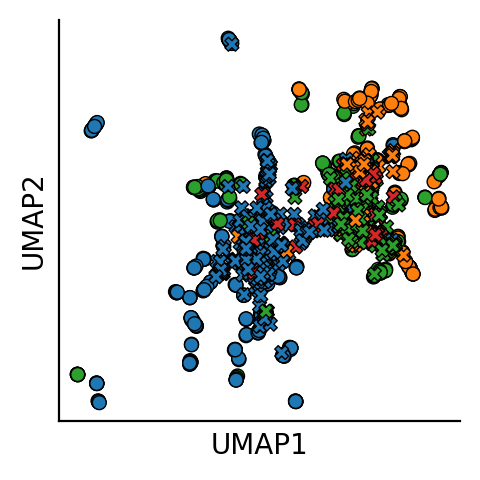

In [47]:
# random_state=0
plt.figure(figsize=(2.5,2.5), dpi=200)  # Equal size for both axes
sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=merged_df, 
    s=25,                    # Marker size
    edgecolor='black',         # Black edge for markers
    linewidth=0.5,             # Line width for marker edges
    hue='Category',            # Color by capitalized category
    style='Type',
    palette='tab10',             # Distinct color palette,
    legend=False
)

plt.xticks([])  # Remove x-axis ticks
plt.yticks([])  # Remove y-axis ticks

# Place the legend outside the plot, on the right
# plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderpad=1, frameon=True, framealpha=1, edgecolor='black', fancybox=False)

sns.despine()
plt.tight_layout()
plt.show()


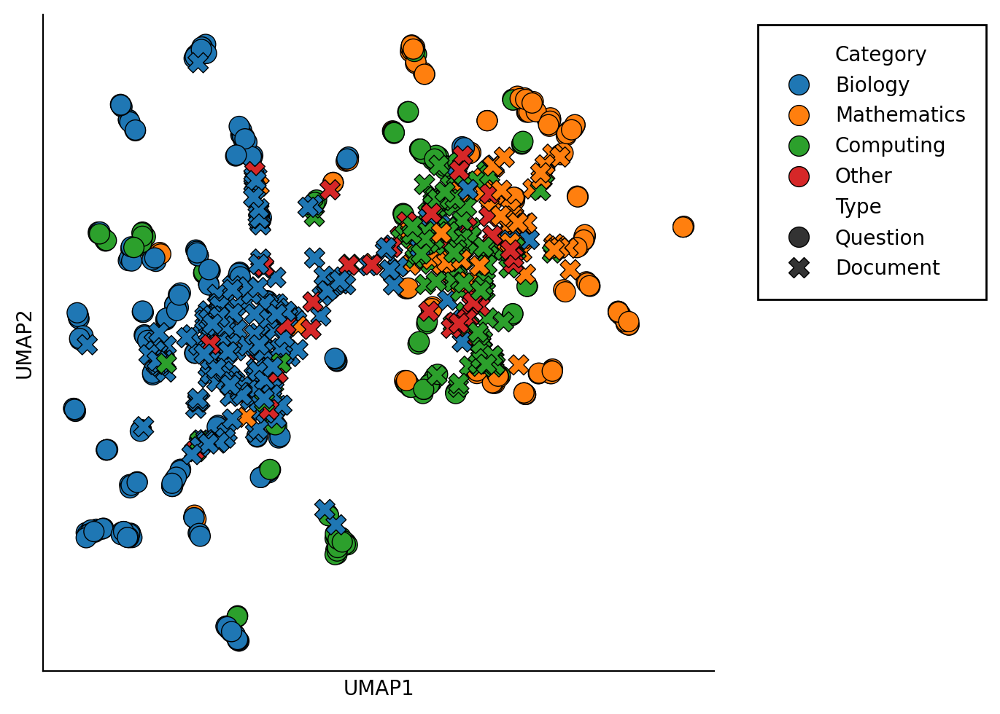

In [84]:
# random_state=2
plt.figure(figsize=(7,5), dpi=200)  # Equal size for both axes
sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=merged_df, 
    s=100,                    # Marker size
    edgecolor='black',         # Black edge for markers
    linewidth=0.5,             # Line width for marker edges
    hue='Category',            # Color by capitalized category
    style='Type',
#    palette='Set2'             # Distinct color palette,
    legend=True
)

plt.xticks([])  # Remove x-axis ticks
plt.yticks([])  # Remove y-axis ticks

# Place the legend outside the plot, on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderpad=1, frameon=True, framealpha=1, edgecolor='black', fancybox=False)

# Remove unnecessary spines
sns.despine()

# Display the plot
plt.tight_layout()
plt.show()


## Embed Questions and Documents Separately

In [85]:
embeddings_docs = []
embeddings_ques = []
for i in range(merged_df.shape[0]):
    if merged_df['Type'].iloc[i] == 'Question':
        embeddings_ques.append(merged_df['ada_embedding'].values[i])
    else:
        embeddings_docs.append(merged_df['ada_embedding'].values[i])
        
embeddings_docs = np.array(embeddings_docs)
embeddings_ques = np.array(embeddings_ques)
print(f"{embeddings_ques.shape=}")
print(f"{embeddings_docs.shape=}")


embeddings_ques.shape=(513, 1536)
embeddings_docs.shape=(519, 1536)


In [90]:
# Document embeddings
rs = 1
umap_model = umap.UMAP(n_components=2, random_state=rs)
umap_embeddings = umap_model.fit_transform(embeddings_docs)
df['UMAP1'] = umap_embeddings[:, 0]
df['UMAP2'] = umap_embeddings[:, 1]

# Question embeddings
umap_model = umap.UMAP(n_components=2, random_state=rs)
umap_embeddings = umap_model.fit_transform(embeddings_ques)
qdf['UMAP1'] = umap_embeddings[:, 0]
qdf['UMAP2'] = umap_embeddings[:, 1]

# Capitalize the first letter of each category for the legend
df['Category']  = df['Category'].str.title()
qdf['Category'] = qdf['Category'].str.title()

/home/jpic/.local/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/jpic/.local/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


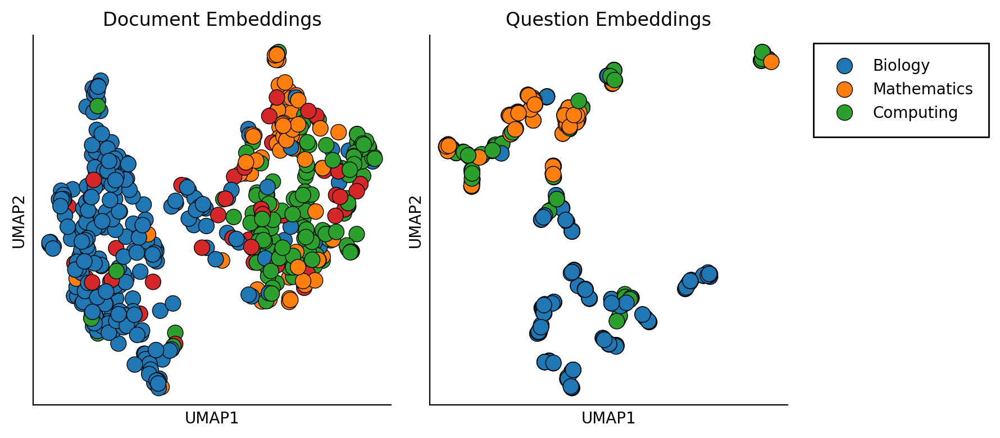

In [89]:
# random_state=0
fig, axs = plt.subplots(1,2,figsize=(9, 4), dpi=200)
sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=df, 
    s=100,                    # Marker size
    edgecolor='black',         # Black edge for markers
    linewidth=0.5,             # Line width for marker edges
    hue='Category',            # Color by capitalized category
#    style='Type',
#    palette='Set2'             # Distinct color palette,
    legend=False,
    ax = axs[0]
)

sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=qdf, 
    s=100,                    # Marker size
    edgecolor='black',         # Black edge for markers
    linewidth=0.5,             # Line width for marker edges
    hue='Category',            # Color by capitalized category
#    style='Type',
#    palette='Set2'             # Distinct color palette,
    legend=True,
    ax = axs[1]
)

axs[0].set_title("Document Embeddings")
axs[1].set_title("Question Embeddings")
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].set_xticks([])
axs[1].set_yticks([])

# Place the legend outside the plot, on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderpad=1, frameon=True, framealpha=1, edgecolor='black', fancybox=False)

# Remove unnecessary spines
sns.despine()

# Display the plot
plt.tight_layout()
plt.show()


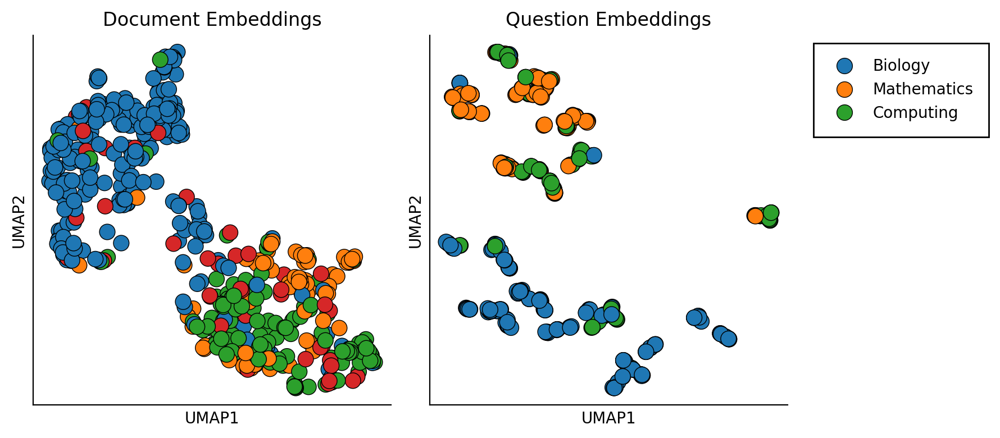

In [91]:
# random_state=1
fig, axs = plt.subplots(1,2,figsize=(9, 4), dpi=200)
sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=df, 
    s=100,                    # Marker size
    edgecolor='black',         # Black edge for markers
    linewidth=0.5,             # Line width for marker edges
    hue='Category',            # Color by capitalized category
#    style='Type',
#    palette='Set2'             # Distinct color palette,
    legend=False,
    ax = axs[0]
)

sns.scatterplot(
    x='UMAP1', 
    y='UMAP2', 
    data=qdf, 
    s=100,                    # Marker size
    edgecolor='black',         # Black edge for markers
    linewidth=0.5,             # Line width for marker edges
    hue='Category',            # Color by capitalized category
#    style='Type',
#    palette='Set2'             # Distinct color palette,
    legend=True,
    ax = axs[1]
)

axs[0].set_title("Document Embeddings")
axs[1].set_title("Question Embeddings")
axs[0].set_xticks([])
axs[0].set_yticks([])
axs[1].set_xticks([])
axs[1].set_yticks([])

# Place the legend outside the plot, on the right
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderpad=1, frameon=True, framealpha=1, edgecolor='black', fancybox=False)

# Remove unnecessary spines
sns.despine()

# Display the plot
plt.tight_layout()
plt.show()


# Radar Plot

These data were obtained by Joshua on September 23, 2024. These use questions generated by Marc using RAGAs on the Digital Library database.

In [226]:
# Load Data
pdf = pd.read_csv(os.path.join(datapath, 'jpic-ragas.csv'))
pdf = pdf.drop(['Unnamed: 0'], axis=1)

qdf = pd.read_csv(os.path.join(datapath, 'machoi_labeled_ds.csv'))
qdf = qdf[['question', 'Computer Science', 'Mathematics', 'Biology']]
qdf['Label'] = qdf[['Computer Science', 'Mathematics', 'Biology']].idxmax(axis=1)
pdf = pdf.merge(qdf[['question', 'Label']], on='question', how='left')
pdf = pdf.drop_duplicates()
pdf.shape

(2210, 22)

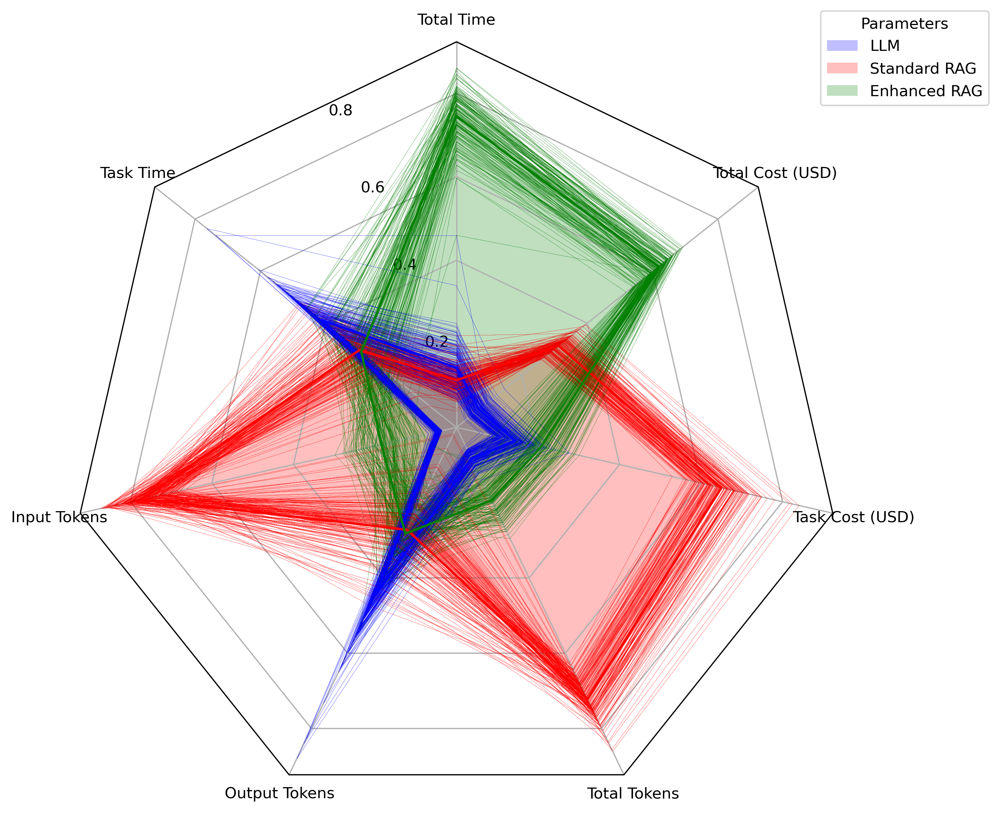

In [227]:
# Filter the dataframe to focus on performance metrics
performance_metrics = ['Total Time', 'Task Time', 'Input Tokens', 'Output Tokens', 
                       'Total Tokens', 'Task Cost (USD)', 'Total Cost (USD)']
N = len(performance_metrics)
spoke_labels = performance_metrics
theta = radar_factory(N, frame='polygon')

colors = ['b', 'r', 'g']
labels = ["LLM", "Standard RAG", "Enhanced RAG"]


fig, ax = plt.subplots(figsize=(9, 9), nrows=1, ncols=1,
                       subplot_kw=dict(projection='radar'),
                       dpi = 300
                      )
fig.subplots_adjust(wspace=0.25, hspace=0.20, top=0.85, bottom=0.05)


for question in pdf['question']:
    # Group data by 'Parameters' and compute the mean for the metrics
    grouped_data = pdf[(pdf['question'] == question) & (pdf['Task'] != 'Compression')][performance_metrics]
#    grouped_data = pdf[pdf['question'] == question][pdf['Task'] != 'Compression'][performance_metrics] # .groupby('Parameters')[performance_metrics] # .mean()
    normalized_data = grouped_data.div(grouped_data.sum(axis=0), axis=1)
    normalized_data['Parameters'] = pdf[pdf['Task'] != 'Compression']['Parameters']
    data = [normalized_data.values[i,:] for i in range(normalized_data.shape[0])]

    ctr = 0
    for i, d in enumerate(data):
        ax.plot(theta, d[:-1], color=colors[i], linewidth=0.05, alpha=0.25)


grouped_data = pdf[pdf['Task'] != 'Compression'].groupby('Parameters')[performance_metrics].mean()
normalized_data = grouped_data.div(grouped_data.sum(axis=0), axis=1)
data = [normalized_data.values[i,:] for i in range(3)]
ctr = 0
for d, color in zip(data, colors):
    ax.plot(theta, d, color=color)
    ax.fill(theta, d, facecolor=color, alpha=0.25, label=labels[ctr])
    ctr += 1
    
ax.set_varlabels(spoke_labels)
ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.05), fontsize='medium', title='Parameters')
plt.show()


# Bar Plots from Profiling the System

In [71]:
df = pd.read_csv(os.path.join(datapath, "jpic_brad_profile.csv"))
df = df.drop(['Unnamed: 0'], axis=1)
df['Task'] = df['Task'].replace(
    {
        'QA' : 'QA (LLM)',
        'QA (RAG, Compression)' : 'QA (ERAG)',
        'Call code': 'Run Code',
        'Select code': 'Select Code',
        'Select database': 'Select Database',
        'Select file' : 'Select File'
    }
)

In [72]:
df.columns
metricColumns = ['Total Time', 'Task Time', 'Total Cost (USD)', 'Task Cost (USD)', 'Input Tokens', 'Output Tokens', 'Total Tokens']
len(metricColumns)

7

In [73]:
df['Model'].unique()

array(['gpt-3.5-turbo-0125', 'gpt-4o'], dtype=object)

/tmp/ipykernel_2237912/1680770072.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1680770072.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1680770072.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1680770072.py:41: UserWarning: set_ticklabels() should only be used with a fixed

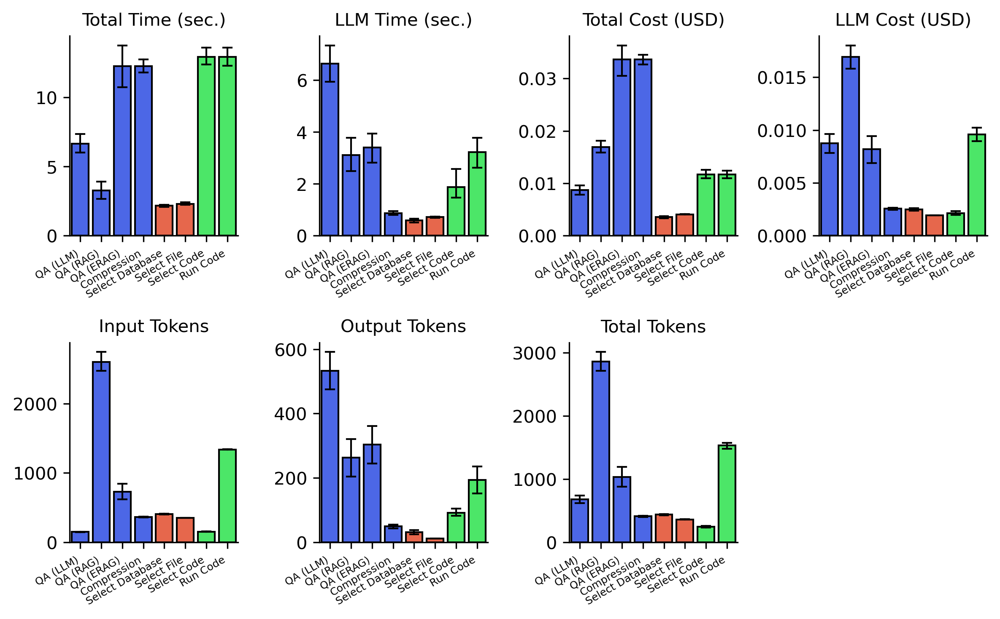

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axs = plt.subplots(2, 4, figsize=(8, 5), dpi=300)  # Adjusted size and dpi for clarity
custom_palette = ['#FF5733',  # Bright Red-Orange
                  '#33FF57',  # Bright Green
                  '#3357FF']  # Bright Blue
additional_colors = ['#FFD700',  # Bright Gold
                     '#FF1493',  # Deep Pink
                     '#00BFFF']
palette_3 = ['#FF8C00',  # Dark Orange
             '#8A2BE2',  # Blue Violet
             '#3CB371']  # Medium Sea Green

# Loop through each metric column to create subplots
for i in range(len(metricColumns)):
    sns.barplot(
        data=df[df['Model'] == 'gpt-4o'],
        y=metricColumns[i],
        x='Task',
        hue='Module',
        ax=axs[i // 4, i % 4],
        legend=False,
        order=['QA (LLM)', 'QA (RAG)', 'QA (ERAG)', 'Compression', 'Select Database', 'Select File', 'Select Code', 'Run Code'],
        edgecolor='k',
        err_kws={"linewidth": 1, "color": "black"},
        capsize=.4,
        palette = custom_palette
    #     ci='sd'
    )
    
    # Set titles and labels
    axs[i // 4, i % 4].set_title(f'{metricColumns[i]}', fontsize=10)
    axs[i // 4, i % 4].set_ylabel('') 
    axs[i // 4, i % 4].set_xlabel('') 
    # axs[i // 4, i % 4].set_ylim([0,])
    
    # Adjust x-ticks
    axs[i // 4, i % 4].tick_params(axis='x', labelsize=6)  # Smaller font size for x-ticks
    axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks

axs[1, 3].set_visible(False)

axs[0, 0].set_title('Total Time (sec.)', fontsize=10)
axs[0, 1].set_title('LLM Time (sec.)', fontsize=10)
axs[0, 3].set_title('LLM Cost (USD)', fontsize=10)

# Improve layout
plt.tight_layout()
sns.despine()
plt.savefig('benchmarking-brad-4o.pdf', format='pdf', bbox_inches='tight')
plt.show()


/tmp/ipykernel_2237912/1057778679.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1057778679.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1057778679.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1057778679.py:41: UserWarning: set_ticklabels() should only be used with a fixed

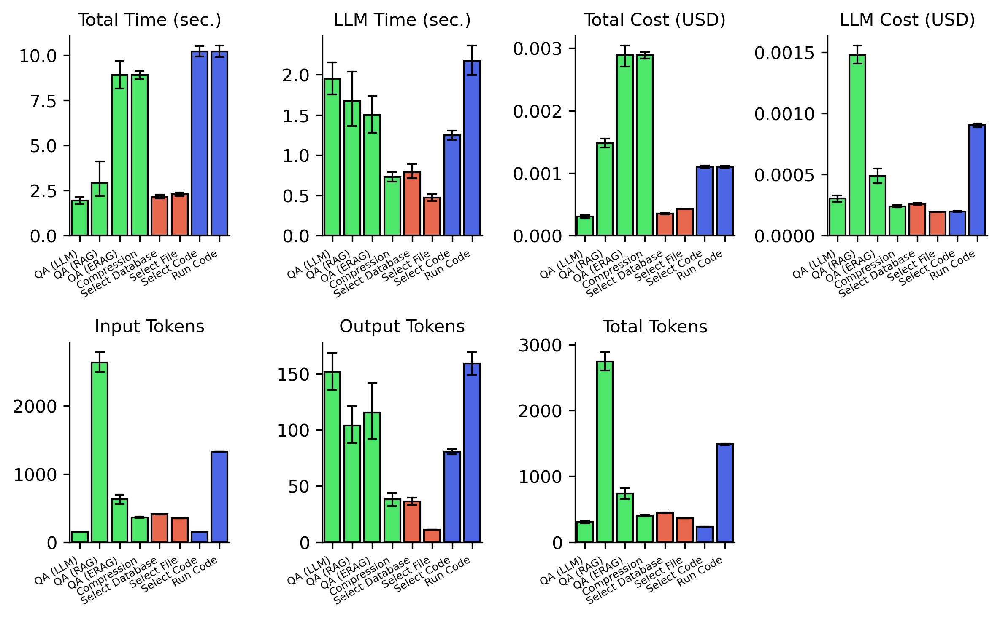

In [75]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axs = plt.subplots(2, 4, figsize=(8, 5), dpi=300)  # Adjusted size and dpi for clarity
custom_palette = ['#FF5733',  # Bright Red-Orange
                  '#33FF57',  # Bright Green
                  '#3357FF']  # Bright Blue
additional_colors = ['#FFD700',  # Bright Gold
                     '#FF1493',  # Deep Pink
                     '#00BFFF']
palette_3 = ['#FF8C00',  # Dark Orange
             '#8A2BE2',  # Blue Violet
             '#3CB371']  # Medium Sea Green

# Loop through each metric column to create subplots
for i in range(len(metricColumns)):
    sns.barplot(
        data=df[df['Model'] == 'gpt-3.5-turbo-0125'],
        y=metricColumns[i],
        x='Task',
        hue='Module',
        ax=axs[i // 4, i % 4],
        legend=False,
        order=['QA (LLM)', 'QA (RAG)', 'QA (ERAG)', 'Compression', 'Select Database', 'Select File', 'Select Code', 'Run Code'],
        edgecolor='k',
        err_kws={"linewidth": 1, "color": "black"},
        capsize=.4,
        palette = custom_palette
    #     ci='sd'
    )
    
    # Set titles and labels
    axs[i // 4, i % 4].set_title(f'{metricColumns[i]}', fontsize=10)
    axs[i // 4, i % 4].set_ylabel('') 
    axs[i // 4, i % 4].set_xlabel('') 
    # axs[i // 4, i % 4].set_ylim([0,])
    
    # Adjust x-ticks
    axs[i // 4, i % 4].tick_params(axis='x', labelsize=6)  # Smaller font size for x-ticks
    axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks

axs[1, 3].set_visible(False)

axs[0, 0].set_title('Total Time (sec.)', fontsize=10)
axs[0, 1].set_title('LLM Time (sec.)', fontsize=10)
axs[0, 3].set_title('LLM Cost (USD)', fontsize=10)

# Improve layout
plt.tight_layout()
sns.despine()
plt.savefig('benchmarking-brad-35.pdf', format='pdf', bbox_inches='tight')
plt.show()


/tmp/ipykernel_2237912/1526854043.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1526854043.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1526854043.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks
/tmp/ipykernel_2237912/1526854043.py:41: UserWarning: set_ticklabels() should only be used with a fixed

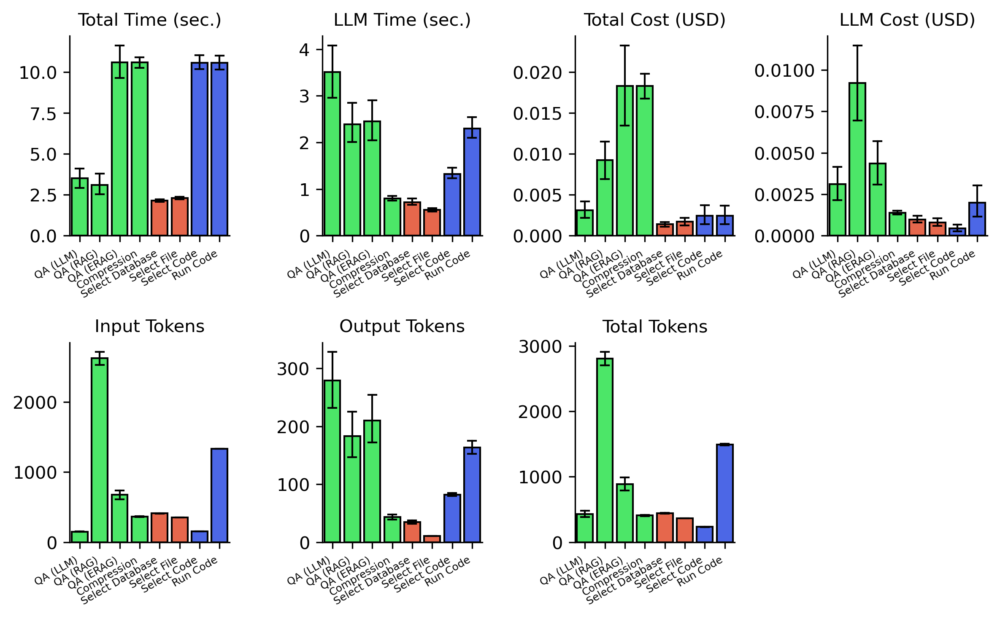

In [76]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create subplots
fig, axs = plt.subplots(2, 4, figsize=(8, 5), dpi=300)  # Adjusted size and dpi for clarity
custom_palette = ['#FF5733',  # Bright Red-Orange
                  '#33FF57',  # Bright Green
                  '#3357FF']  # Bright Blue
additional_colors = ['#FFD700',  # Bright Gold
                     '#FF1493',  # Deep Pink
                     '#00BFFF']
palette_3 = ['#FF8C00',  # Dark Orange
             '#8A2BE2',  # Blue Violet
             '#3CB371']  # Medium Sea Green

# Loop through each metric column to create subplots
for i in range(len(metricColumns)):
    sns.barplot(
        data=df,
        y=metricColumns[i],
        x='Task',
        hue='Module',
        ax=axs[i // 4, i % 4],
        legend=False,
        order=['QA (LLM)', 'QA (RAG)', 'QA (ERAG)', 'Compression', 'Select Database', 'Select File', 'Select Code', 'Run Code'],
        edgecolor='k',
        err_kws={"linewidth": 1, "color": "black"},
        capsize=.4,
        palette = custom_palette
    #     ci='sd'
    )
    
    # Set titles and labels
    axs[i // 4, i % 4].set_title(f'{metricColumns[i]}', fontsize=10)
    axs[i // 4, i % 4].set_ylabel('') 
    axs[i // 4, i % 4].set_xlabel('') 
    # axs[i // 4, i % 4].set_ylim([0,])
    
    # Adjust x-ticks
    axs[i // 4, i % 4].tick_params(axis='x', labelsize=6)  # Smaller font size for x-ticks
    axs[i // 4, i % 4].set_xticklabels(axs[i // 4, i % 4].get_xticklabels(), rotation=30, ha='right', fontsize=6)  # Rotate x-ticks

axs[1, 3].set_visible(False)

axs[0, 0].set_title('Total Time (sec.)', fontsize=10)
axs[0, 1].set_title('LLM Time (sec.)', fontsize=10)
axs[0, 3].set_title('LLM Cost (USD)', fontsize=10)


# Improve layout
plt.tight_layout()
sns.despine()
plt.savefig('benchmarking-brad.pdf', format='pdf', bbox_inches='tight')
plt.show()


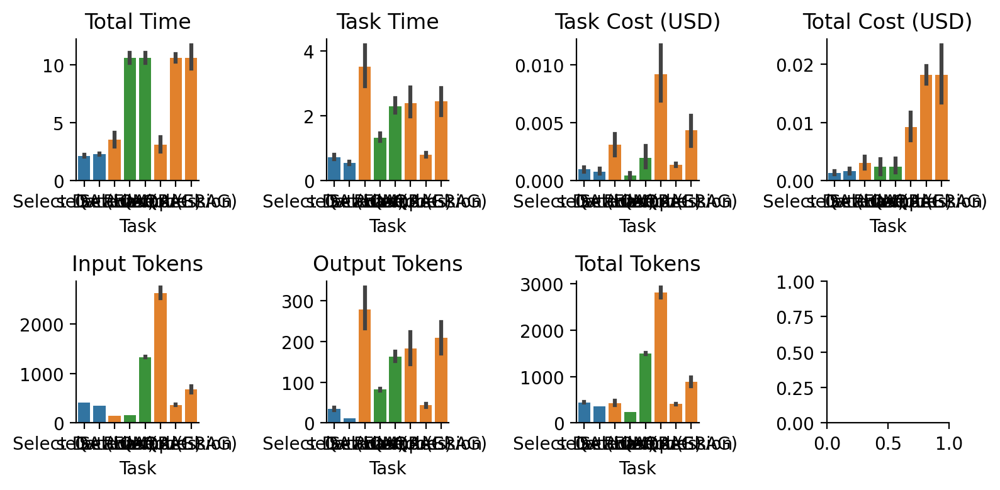

In [29]:
fig, axs = plt.subplots(2, 4, figsize=(8,4), dpi=200)
for i in range(len(metricColumns)):
    sns.barplot(data=df,
            y = metricColumns[i],
            x = 'Task',
            hue = 'Module',
            ax = axs[i // 4, i % 4],
            legend=False
           )
    axs[i // 4, i % 4].set_title(f'{metricColumns[i]}', fontsize=12)
    axs[i // 4, i % 4].set_ylabel('') 
    

plt.tight_layout()
sns.despine()

<Axes: xlabel='Task', ylabel='Total Cost (USD)'>

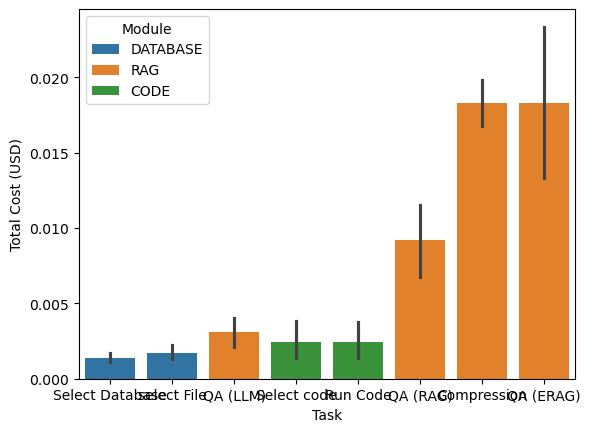

In [14]:
sns.barplot(data=df,
            y = 'Total Cost (USD)',
            x = 'Task',
            hue = 'Module'
           )


# Pairs Plot from Profiling the System

In [2]:
df = pd.read_csv(os.path.join(datapath, "jpic_brad_profile.csv"))
df = df.drop(['Unnamed: 0'], axis=1)
df

,Model,Module,Total Time,Parameters,Task,Task Time,Input Tokens,Output Tokens,Total Tokens,Task Cost (USD),Total Cost (USD)
0,gpt-3.5-turbo-0125,DATABASE,2.055127,DATABASE,Select database,0.873842,427.0,51.0,478.0,0.000290,0.000290
1,gpt-3.5-turbo-0125,DATABASE,2.044675,DATABASE,Select database,0.928157,429.0,51.0,480.0,0.000291,0.000291
2,gpt-3.5-turbo-0125,DATABASE,1.943434,DATABASE,Select database,0.852115,427.0,51.0,478.0,0.000290,0.000290
3,gpt-3.5-turbo-0125,DATABASE,1.924876,DATABASE,Select database,0.774714,427.0,52.0,479.0,0.000291,0.000291
4,gpt-3.5-turbo-0125,DATABASE,2.357032,DATABASE,Select database,1.258245,425.0,50.0,475.0,0.000287,0.000287
...,...,...,...,...,...,...,...,...,...,...,...
824,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,0.364309,403.0,1.0,404.0,0.002030,0.038485
825,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,0.991231,463.0,1.0,464.0,0.002330,0.038485
826,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,1.886669,367.0,115.0,482.0,0.003560,0.038485
827,gpt-4o,RAG,17.479515,"RAG, Compression",Compression,1.145913,391.0,71.0,462.0,0.003020,0.038485


## Descriptive Statistics

In [7]:
print(f"{df['Task Time'].mean()=}")
print(f"{df['Task Time'].std()=}")


df['Task Time'].mean()=1.238442285788505
df['Task Time'].std()=1.2903370138557966


## Table

In [ ]:
# Sample data for demonstration
tasks = [f'Task {i+1}' for i in range(8)]
metrics = ['Total Tokens', 'Task Time', 'Total Cost (USD)']
models = ['Model A', 'Model B']

# Creating random sample data (replace with actual values)
data = np.random.rand(8, 6)  # 8 tasks, 6 metric/model combinations

# Create a MultiIndex for columns
multi_columns = pd.MultiIndex.from_product([metrics, models])

# Create DataFrame
df_table = pd.DataFrame(data, index=tasks, columns=multi_columns)

# Display the DataFrame
print(df_table)

# To export the table to a .csv file
df_table.to_csv("metric_model_table.csv")


In [10]:
summary_table = df.groupby(['Task', 'Model']).agg({
    'Total Tokens': ['mean', 'std'],
    'Task Time': ['mean', 'std'],
    'Total Cost (USD)': ['mean', 'std']
}).reset_index()
summary_table

Task               Model Total Tokens              \
                                                      mean         std   
0               Call code  gpt-3.5-turbo-0125  1488.214286   29.260461   
1               Call code              gpt-4o  1530.750000   51.246951   
2             Compression  gpt-3.5-turbo-0125   403.450000   73.001984   
3             Compression              gpt-4o   410.777273   77.889105   
4                      QA  gpt-3.5-turbo-0125   303.136364   57.215054   
5                      QA              gpt-4o   680.181818  146.798416   
6                QA (RAG)  gpt-3.5-turbo-0125  2746.500000  340.042959   
7                QA (RAG)              gpt-4o  2863.772727  367.623634   
8   QA (RAG, Compression)  gpt-3.5-turbo-0125   743.636364  202.115607   
9   QA (RAG, Compression)              gpt-4o  1033.727273  372.963573   
10            Select code  gpt-3.5-turbo-0125   233.857143    7.001134   
11            Select code              gpt-4o   243.500000   14.153916   
12        Select database  gpt-3.5-turbo-0125   448.376623   29.288959   
13        Select database              gpt-4o   436.189189   34.020286   
14            Select file  gpt-3.5-turbo-0125   363.351351    1.686815   
15            Select file              gpt-4o   361.250000    1.650359   

   Task Time           Total Cost (USD)            
        mean       std             mean       std  
0   2.168250  0.517099         0.001101  0.000047  
1   3.220689  0.742602         0.011709  0.000881  
2   0.727576  0.485570         0.002885  0.000411  
3   0.872728  0.556461         0.033632  0.006884  
4   1.947038  0.666117         0.000303  0.000085  
5   6.647976  1.707168         0.008729  0.002185  
6   1.669950  0.871468         0.001477  0.000172  
7   3.107801  1.576300         0.016941  0.002758  
8   1.495700  0.572439         0.002885  0.000420  
9   3.408862  1.352951         0.033632  0.007030  
10  1.246085  0.157862         0.001101  0.000047  
11  1.879377  0.710803         0.011709  0.000881  
12  0.784103  0.404019         0.000353  0.000071  
13  0.585165  0.226514         0.003524  0.000605  
14  0.470773  0.133212         0.000425  0.000003  
15  0.710930  0.050193         0.004074  0.000018

In [15]:
import pandas as pd

# Group the data by 'Task' and 'Model' and calculate the mean and standard deviation
summary_table = df.groupby(['Task', 'Model']).agg({
    'Total Tokens': ['mean', 'std'],
    'Task Time': ['mean', 'std'],
    'Total Cost (USD)': ['mean', 'std']
}).reset_index()

# Flatten the column multi-index
summary_table.columns = ['Task', 'Model', 'Total Tokens (Mean)', 'Total Tokens (Std)', 
                         'Task Time (Mean)', 'Task Time (Std)', 
                         'Total Cost (USD) (Mean)', 'Total Cost (USD) (Std)']

# Combine mean and standard deviation into a single column for a cleaner display
summary_table['Total Tokens'] = summary_table['Total Tokens (Mean)'].round(2).astype(str) + ' ± ' + summary_table['Total Tokens (Std)'].round(2).astype(str)
summary_table['Task Time'] = summary_table['Task Time (Mean)'].round(2).astype(str) + ' ± ' + summary_table['Task Time (Std)'].round(2).astype(str)
summary_table['Total Cost (USD)'] = summary_table['Total Cost (USD) (Mean)'].round(3).astype(str) + ' ± ' + summary_table['Total Cost (USD) (Std)'].round(3).astype(str)

# Select only the relevant columns
summary_table = summary_table[['Task', 'Model', 'Total Tokens', 'Task Time', 'Total Cost (USD)']]

# Display the summary table
latex_table = summary_table.to_latex(index=False, column_format='|c|c|c|c|c|', escape=False)
print(latex_table)

\begin{tabular}{|c|c|c|c|c|}
\toprule
Task & Model & Total Tokens & Task Time & Total Cost (USD) \\
\midrule
Call code & gpt-3.5-turbo-0125 & 1488.21 ± 29.26 & 2.17 ± 0.52 & 0.001 ± 0.0 \\
Call code & gpt-4o & 1530.75 ± 51.25 & 3.22 ± 0.74 & 0.012 ± 0.001 \\
Compression & gpt-3.5-turbo-0125 & 403.45 ± 73.0 & 0.73 ± 0.49 & 0.003 ± 0.0 \\
Compression & gpt-4o & 410.78 ± 77.89 & 0.87 ± 0.56 & 0.034 ± 0.007 \\
QA & gpt-3.5-turbo-0125 & 303.14 ± 57.22 & 1.95 ± 0.67 & 0.0 ± 0.0 \\
QA & gpt-4o & 680.18 ± 146.8 & 6.65 ± 1.71 & 0.009 ± 0.002 \\
QA (RAG) & gpt-3.5-turbo-0125 & 2746.5 ± 340.04 & 1.67 ± 0.87 & 0.001 ± 0.0 \\
QA (RAG) & gpt-4o & 2863.77 ± 367.62 & 3.11 ± 1.58 & 0.017 ± 0.003 \\
QA (RAG, Compression) & gpt-3.5-turbo-0125 & 743.64 ± 202.12 & 1.5 ± 0.57 & 0.003 ± 0.0 \\
QA (RAG, Compression) & gpt-4o & 1033.73 ± 372.96 & 3.41 ± 1.35 & 0.034 ± 0.007 \\
Select code & gpt-3.5-turbo-0125 & 233.86 ± 7.0 & 1.25 ± 0.16 & 0.001 ± 0.0 \\
Select code & gpt-4o & 243.5 ± 14.15 & 1.88 ± 0.71 & 0.0

In [16]:
import pandas as pd

# Group the data by 'Task' and 'Model' and calculate the mean and standard deviation
summary_table = df.groupby(['Task', 'Model']).agg({
    'Total Tokens': ['mean', 'std'],
    'Task Time': ['mean', 'std'],
    'Total Cost (USD)': ['mean', 'std']
}).reset_index()

# Flatten the column multi-index
summary_table.columns = ['Task', 'Model', 'Total Tokens (Mean)', 'Total Tokens (Std)', 
                         'Task Time (Mean)', 'Task Time (Std)', 
                         'Total Cost (USD) (Mean)', 'Total Cost (USD) (Std)']

# Combine mean and standard deviation into a single column for a cleaner display
summary_table['Total Tokens'] = summary_table['Total Tokens (Mean)'].round(2).astype(str) + ' ± ' + summary_table['Total Tokens (Std)'].round(2).astype(str)
summary_table['Task Time'] = summary_table['Task Time (Mean)'].round(2).astype(str) + ' ± ' + summary_table['Task Time (Std)'].round(2).astype(str)
summary_table['Total Cost (USD)'] = summary_table['Total Cost (USD) (Mean)'].round(3).astype(str) + ' ± ' + summary_table['Total Cost (USD) (Std)'].round(3).astype(str)

# Select only the relevant columns
summary_table = summary_table[['Task', 'Model', 'Total Tokens', 'Task Time', 'Total Cost (USD)']]

# Now calculate the averages for each model across all tasks
mean_table = df.groupby('Model').agg({
    'Total Tokens': 'mean',
    'Task Time': 'mean',
    'Total Cost (USD)': 'mean'
}).reset_index()

# Convert the mean values into string format similar to the table above
mean_table['Total Tokens'] = mean_table['Total Tokens'].round(2).astype(str)
mean_table['Task Time'] = mean_table['Task Time'].round(2).astype(str)
mean_table['Total Cost (USD)'] = mean_table['Total Cost (USD)'].round(3).astype(str)

# Create a new DataFrame that will hold the average rows for each model
average_rows = pd.DataFrame({
    'Task': ['Average'] * len(mean_table),
    'Model': mean_table['Model'],
    'Total Tokens': mean_table['Total Tokens'],
    'Task Time': mean_table['Task Time'],
    'Total Cost (USD)': mean_table['Total Cost (USD)']
})

# Append the average rows to the summary_table
summary_table_with_avg = pd.concat([summary_table, average_rows], ignore_index=True)

# Display the summary table with averages
latex_table_with_avg = summary_table_with_avg.to_latex(index=False, column_format='|c|c|c|c|c|', escape=False)
print(latex_table_with_avg)


\begin{tabular}{|c|c|c|c|c|}
\toprule
Task & Model & Total Tokens & Task Time & Total Cost (USD) \\
\midrule
Call code & gpt-3.5-turbo-0125 & 1488.21 ± 29.26 & 2.17 ± 0.52 & 0.001 ± 0.0 \\
Call code & gpt-4o & 1530.75 ± 51.25 & 3.22 ± 0.74 & 0.012 ± 0.001 \\
Compression & gpt-3.5-turbo-0125 & 403.45 ± 73.0 & 0.73 ± 0.49 & 0.003 ± 0.0 \\
Compression & gpt-4o & 410.78 ± 77.89 & 0.87 ± 0.56 & 0.034 ± 0.007 \\
QA & gpt-3.5-turbo-0125 & 303.14 ± 57.22 & 1.95 ± 0.67 & 0.0 ± 0.0 \\
QA & gpt-4o & 680.18 ± 146.8 & 6.65 ± 1.71 & 0.009 ± 0.002 \\
QA (RAG) & gpt-3.5-turbo-0125 & 2746.5 ± 340.04 & 1.67 ± 0.87 & 0.001 ± 0.0 \\
QA (RAG) & gpt-4o & 2863.77 ± 367.62 & 3.11 ± 1.58 & 0.017 ± 0.003 \\
QA (RAG, Compression) & gpt-3.5-turbo-0125 & 743.64 ± 202.12 & 1.5 ± 0.57 & 0.003 ± 0.0 \\
QA (RAG, Compression) & gpt-4o & 1033.73 ± 372.96 & 3.41 ± 1.35 & 0.034 ± 0.007 \\
Select code & gpt-3.5-turbo-0125 & 233.86 ± 7.0 & 1.25 ± 0.16 & 0.001 ± 0.0 \\
Select code & gpt-4o & 243.5 ± 14.15 & 1.88 ± 0.71 & 0.0

## Graphic

<Figure size 1500x1500 with 0 Axes>

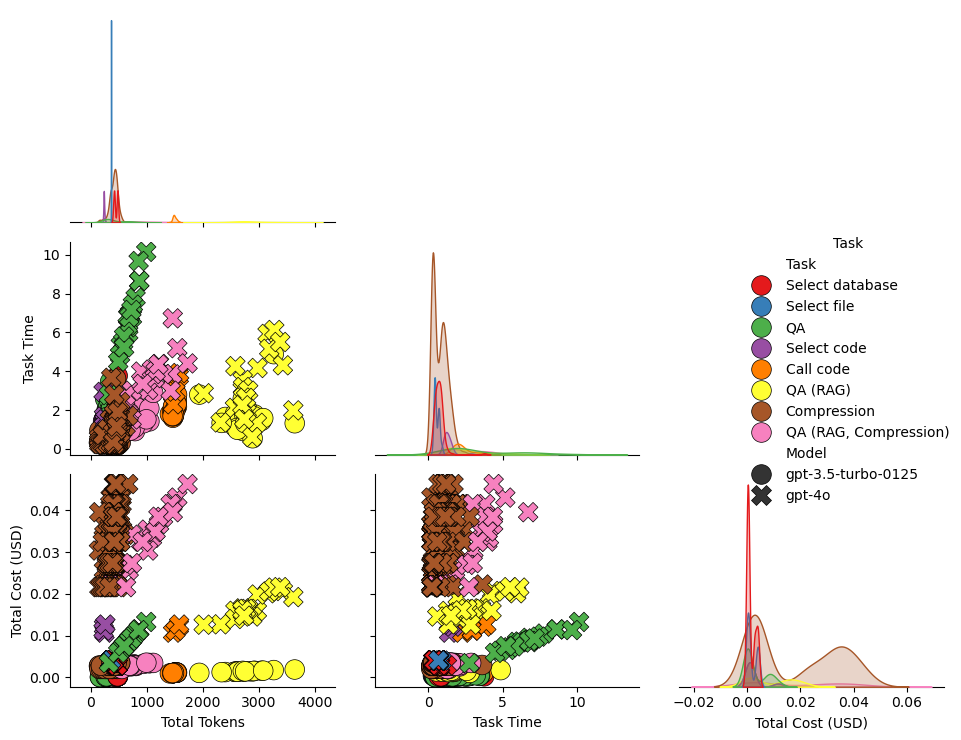

In [68]:
log_df = df

# Variables for the pairplot
plot_vars = ['Total Tokens', 'Task Time', 'Total Cost (USD)']

# Create the pairplot
plt.figure(figsize=(5, 5), dpi=300)
pairplot = sns.pairplot(data=log_df,
                        vars=plot_vars,
                        hue='Task',              # Color points by 'Task'
                        plot_kws={'s': 200,       # Marker size
                                  'edgecolor': 'black',  # Black edges around points
                                  'linewidth': 0.5,
                                  'style':log_df['Model']
                                 },     # Line width for edges
                        corner=True,             # Only plot lower triangle to avoid redundancy
                        height=2.5,              # Size of each subplot
                        palette='Set1',          # Use 'Set1' color palette for nice colors
                       )

# Improve layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


<Figure size 900x900 with 0 Axes>

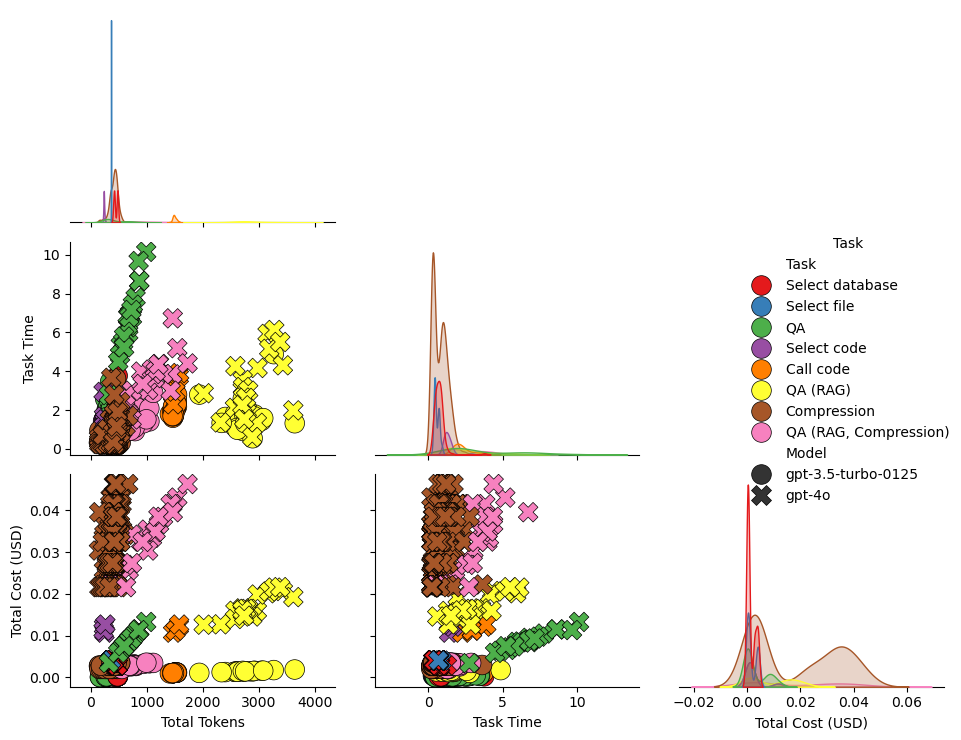

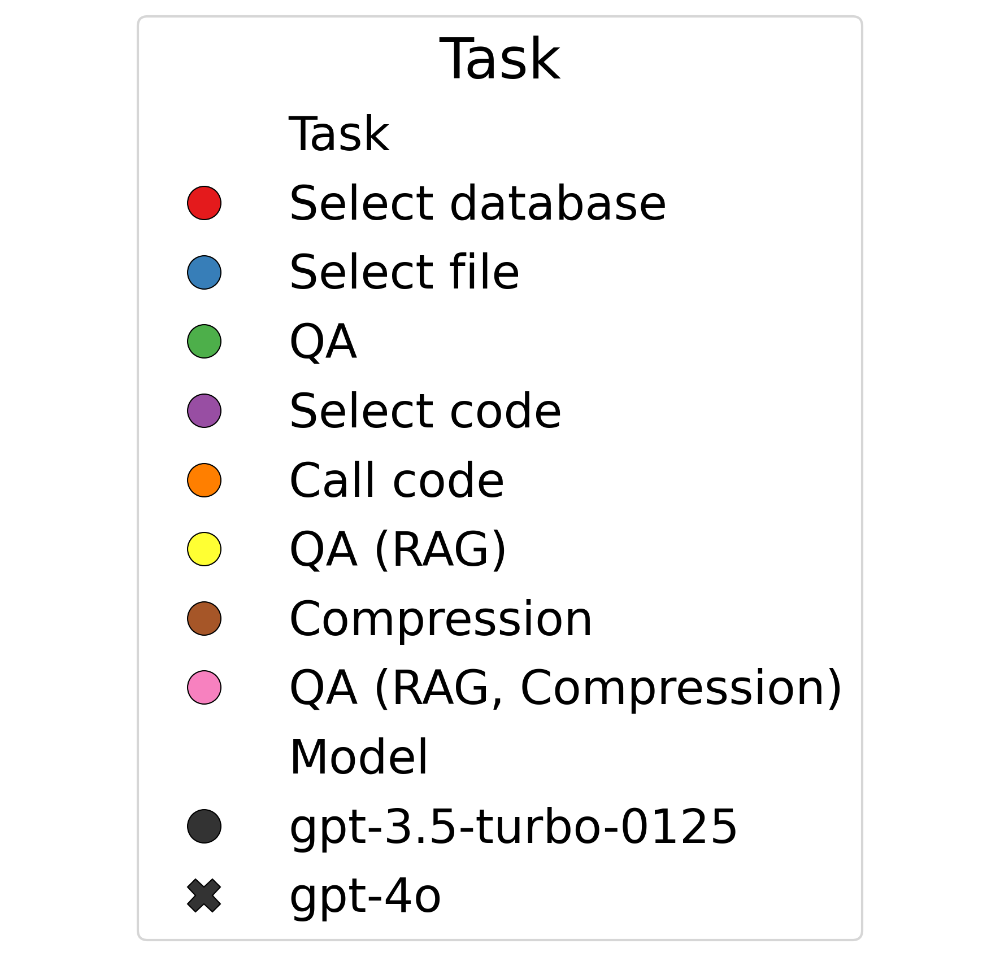

In [69]:
log_df = df

# Variables for the pairplot
plot_vars = ['Total Tokens', 'Task Time', 'Total Cost (USD)']

# Create the pairplot
plt.figure(figsize=(3, 3), dpi=300)
pairplot = sns.pairplot(data=log_df,
                        vars=plot_vars,
                        hue='Task',              # Color points by 'Task'
                        plot_kws={'s': 200,       # Marker size
                                  'edgecolor': 'black',  # Black edges around points
                                  'linewidth': 0.5,
                                  'style':log_df['Model']
                                 },     # Line width for edges
                        corner=True,             # Only plot lower triangle to avoid redundancy
                        height=2.5,              # Size of each subplot
                        palette='Set1')          # Use 'Set1' color palette for nice colors

# Improve layout for better spacing
plt.tight_layout()

# Show the pairplot without the legend
plt.show()

# Extract the handles and labels for the legend
handles, labels = pairplot._legend_data.values(), pairplot._legend_data.keys()

# Create a separate figure for the legend, make it extra big
legend_fig, legend_ax = plt.subplots(figsize=(6, 4), dpi=300)
legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=20, title="Task", title_fontsize=24)
legend_ax.axis('off')  # Hide the axes for the legend figure

# Adjust layout for the legend
plt.tight_layout()

# Show the legend figure
plt.show()


<Figure size 1500x1500 with 0 Axes>

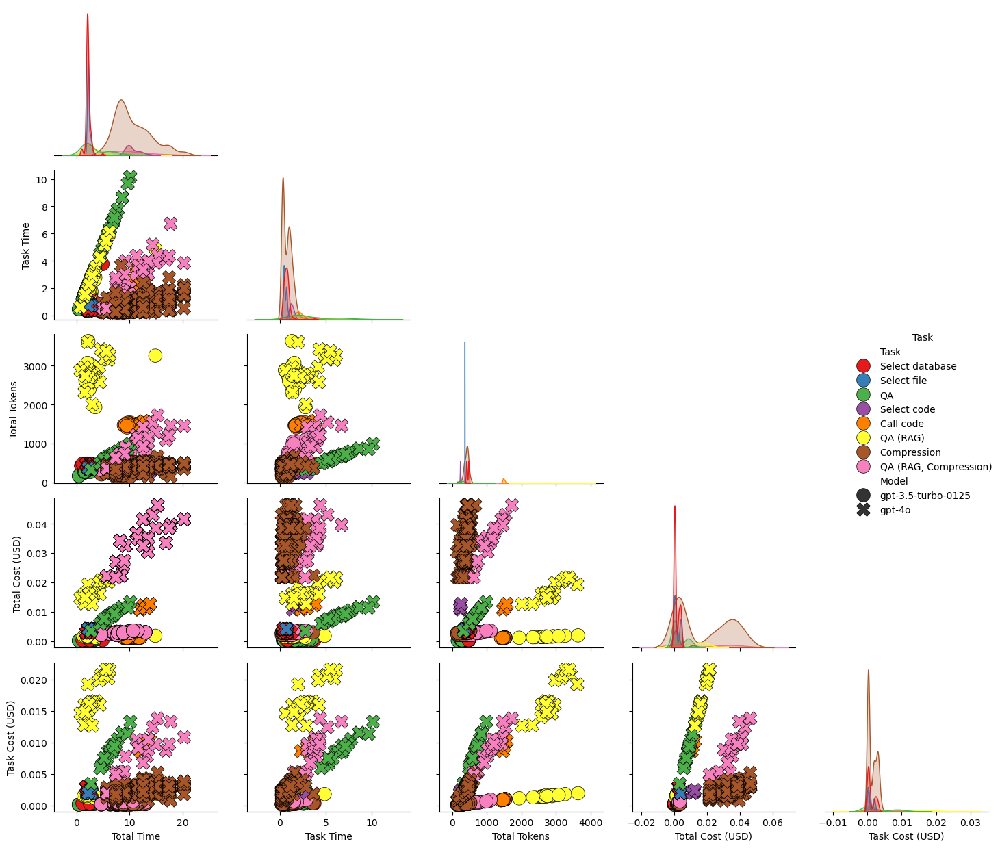

In [235]:
log_df = df

# Variables for the pairplot
plot_vars = ['Total Time', 'Task Time', 'Total Tokens', 'Total Cost (USD)', 'Task Cost (USD)']

# Create the pairplot
plt.figure(figsize=(5, 5), dpi=300)
pairplot = sns.pairplot(data=log_df,
                        vars=plot_vars,
                        hue='Task',              # Color points by 'Task'
                        plot_kws={'s': 200,       # Marker size
                                  'edgecolor': 'black',  # Black edges around points
                                  'linewidth': 0.5,
                                  'style':log_df['Model']
                                 },     # Line width for edges
                        corner=True,             # Only plot lower triangle to avoid redundancy
                        height=2.5,              # Size of each subplot
                        palette='Set1')          # Use 'Set1' color palette for nice colors

# Improve layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


<Figure size 2400x2100 with 0 Axes>

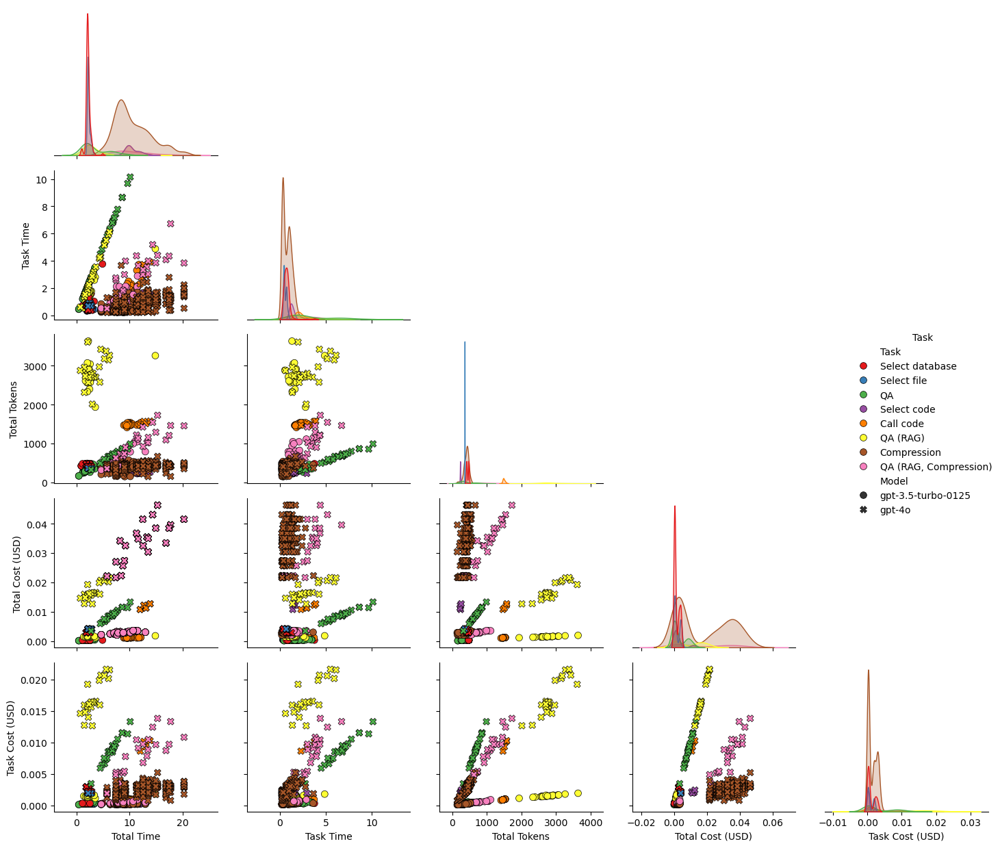

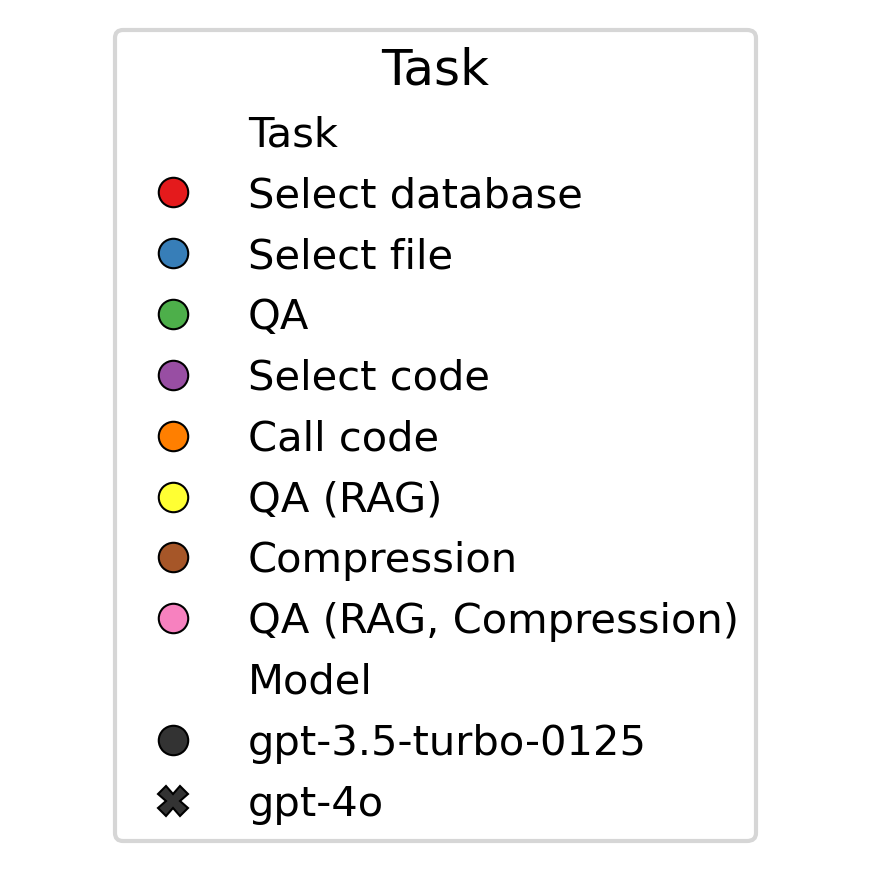

In [231]:
# Variables for the pairplot
plot_vars = ['Total Time', 'Task Time', 'Total Tokens', 'Total Cost (USD)', 'Task Cost (USD)']

# Create the pairplot
plt.figure(figsize=(8, 7), dpi=300)
pairplot = sns.pairplot(data=log_df,
                        vars=plot_vars,
                        hue='Task',              # Color points by 'Task'
                        plot_kws={'s': 50,       # Marker size
                                  'edgecolor': 'black',  # Black edges around points
                                  'linewidth': 0.5,
                                  'style':log_df['Model']
                                 },     # Line width for edges
                        corner=True,             # Only plot lower triangle to avoid redundancy
                        height=2.5,              # Size of each subplot
                        palette='Set1')          # Use 'Set1' color palette for nice colors

# Improve layout for better spacing
plt.tight_layout()

# Extract the legend handles and labels
handles, labels = pairplot._legend_data.values(), pairplot._legend_data.keys()

# Create a separate figure for the legend
legend_fig, legend_ax = plt.subplots(figsize=(3, 2), dpi=300)
legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=10, title="Task", title_fontsize=12)
legend_ax.axis('off')  # Hide the axes for the legend figure

# Adjust layout for the legend
plt.tight_layout()

# Show the plot without the legend
plt.show()

# Show the separate legend figure
# legend_fig.show()


In [232]:
legend_fig.show()


/tmp/ipykernel_3823768/2829170304.py:1: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  legend_fig.show()


# Marc's Box Plots

In [83]:
jdf = pd.read_csv(os.path.join(datapath, "jpic_ragas_9_24_2024.csv"))
jdf = df.drop_duplicates()
jdf.columns

Index(['Model', 'Module', 'Total Time', 'Parameters', 'Task', 'Task Time',
       'Input Tokens', 'Output Tokens', 'Total Tokens', 'Task Cost (USD)',
       'Total Cost (USD)'],
      dtype='object')

In [84]:
df = pd.read_csv(os.path.join(datapath, "machoi_labeled_ds.csv"))
df['Parameters'] = df['BRAD']
df['Question Type'] = df['question type']
df['Label'] = df['machoi-labels'].replace({
    'b' : 'Biology',
    'm' : 'Mathematics',
    'c' : 'Computer Science',
    'mb': 'Mathematics',
    'bm': 'Mathematics',
    'mc': 'Mathematics',
    'cm': 'Mathematics',
    'bmc': 'Mathematics',
    'cb': 'Computer Science',
    'bc': 'Computer Science'
})

In [63]:
df['machoi-labels'].unique()

array(['b', 'm', 'bm', 'bc', 'mc', 'bmc', 'c', 'cm', 'mb', 'cb'],
      dtype=object)

In [76]:
df['Parameters'].unique()

array(['vanilla', 'enhanced', 'rag'], dtype=object)

/tmp/ipykernel_2237912/372212683.py:43: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_2237912/372212683.py:43: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_2237912/372212683.py:45: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 95)` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0, 1], **barplot_kwargs_2)
/tmp/ipykernel_2237912/372212683.py:45: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[0, 1], **barplot_kwargs_2)
/tmp/ipykernel_2237912/372212683.py:52: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar

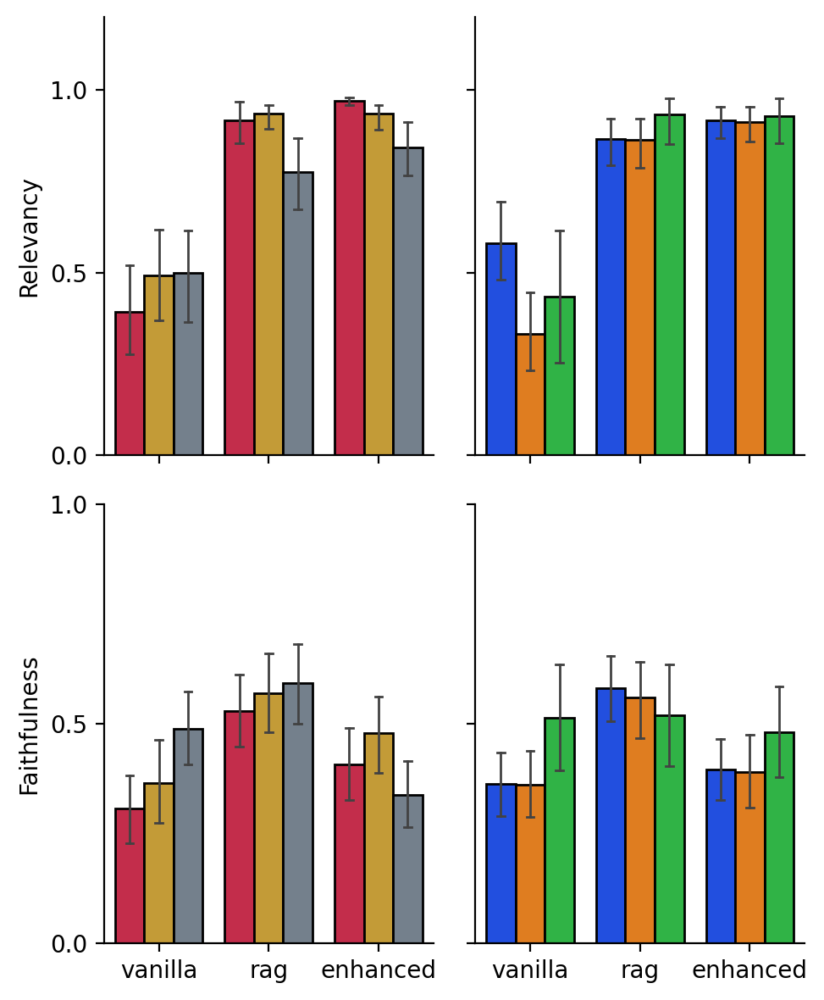

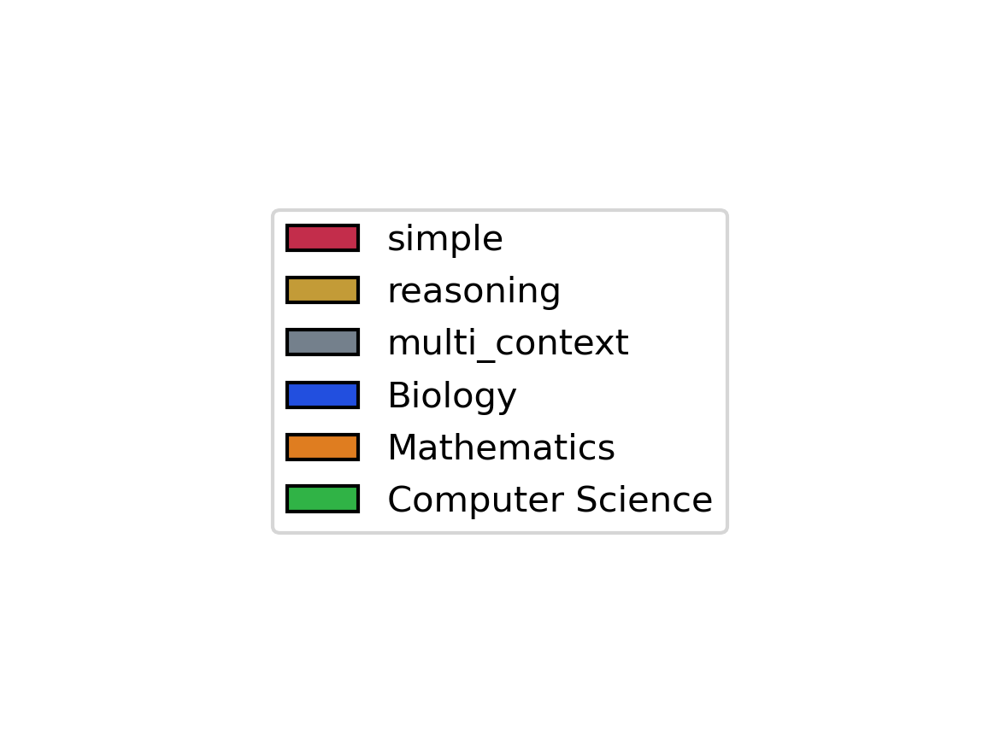

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is already defined and contains the necessary data

fig, axs = plt.subplots(2, 2, figsize=(5, 6), dpi=200, sharex=True)

parameter_order = ['vanilla', 'rag', 'enhanced']


# Remove the individual legends from the subplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
  #  'ci': 'sd',  # Standard deviation bars
    'palette': ['#DC143C', '#DAA520', '#708090'], # sns.color_palette("hls", 8),  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot
    'order': parameter_order,
    'ci':95
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
  #  'ci': 'sd',  # Standard deviation bars
    'palette': 'bright',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot
    'order': parameter_order,
    'ci':95
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
#sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
sns.barplot(y='answer_relevancy', ax=axs[0, 1], **barplot_kwargs_2)
#sns.barplot(y='answer_correctness', ax=axs[0, 1], **barplot_kwargs_2)

# Set legend = True for the third row plots
barplot_kwargs['legend'] = True
barplot_kwargs_2['legend'] = True

sns.barplot(y='faithfulness', ax=axs[1, 0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[1, 1], **barplot_kwargs_2)

# Create a single figure legend for the entire figure
# Get handles and labels from both 'Question Type' and 'Label'
handles_1, labels_1 = axs[1, 0].get_legend_handles_labels()
handles_2, labels_2 = axs[1, 1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Remove individual subplot legends to avoid overlap
axs[1, 0].legend_.remove()
axs[1, 1].legend_.remove()

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Set y-limits and y-ticks
axs[0, 0].set_ylim([0, 1.2])
axs[0, 1].set_ylim([0, 1.2])
axs[1, 0].set_ylim([0, 1])
axs[1, 1].set_ylim([0, 1])
#axs[2, 0].set_ylim([0, 1])
#axs[2, 1].set_ylim([0, 1])
axs[0, 0].set_yticks([0, 0.5, 1])
axs[1, 0].set_yticks([0, 0.5, 1])
#axs[2, 0].set_yticks([0, 0.5, 1])
axs[0, 1].set_yticks([0, 0.5, 1], labels=[])
axs[1, 1].set_yticks([0, 0.5, 1], labels=[])
#axs[2, 1].set_yticks([0, 0.5, 1], labels=[])
axs[0, 1].set_ylabel(None)
axs[1, 1].set_ylabel(None)
#axs[2, 1].set_ylabel(None)

#axs[1,0].set_ylabel("Relevancy")
axs[0,0].set_ylabel("Relevancy")
axs[1,0].set_ylabel("Faithfulness")
axs[1,0].set_xlabel("")
axs[1,1].set_xlabel("")

# Despine and adjust layout
sns.despine()
plt.tight_layout()

# Save the main figure to a PDF

# Now, create a separate figure for the legend
legend_fig, legend_ax = plt.subplots(figsize=(4, 3), dpi=300)
legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=10, title="", title_fontsize=12)
legend_ax.axis('off')  # Hide the axis in the legend figure

# Adjust layout for the legend and save it to a PDF
plt.tight_layout()
# legend_fig.savefig('bmk_legend_figure.pdf')

# Display the figures
plt.show()


/tmp/ipykernel_471874/2109147590.py:36: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_471874/2109147590.py:36: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_471874/2109147590.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_471874/2109147590.py:37: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_471874/2109147590.py:38: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for t

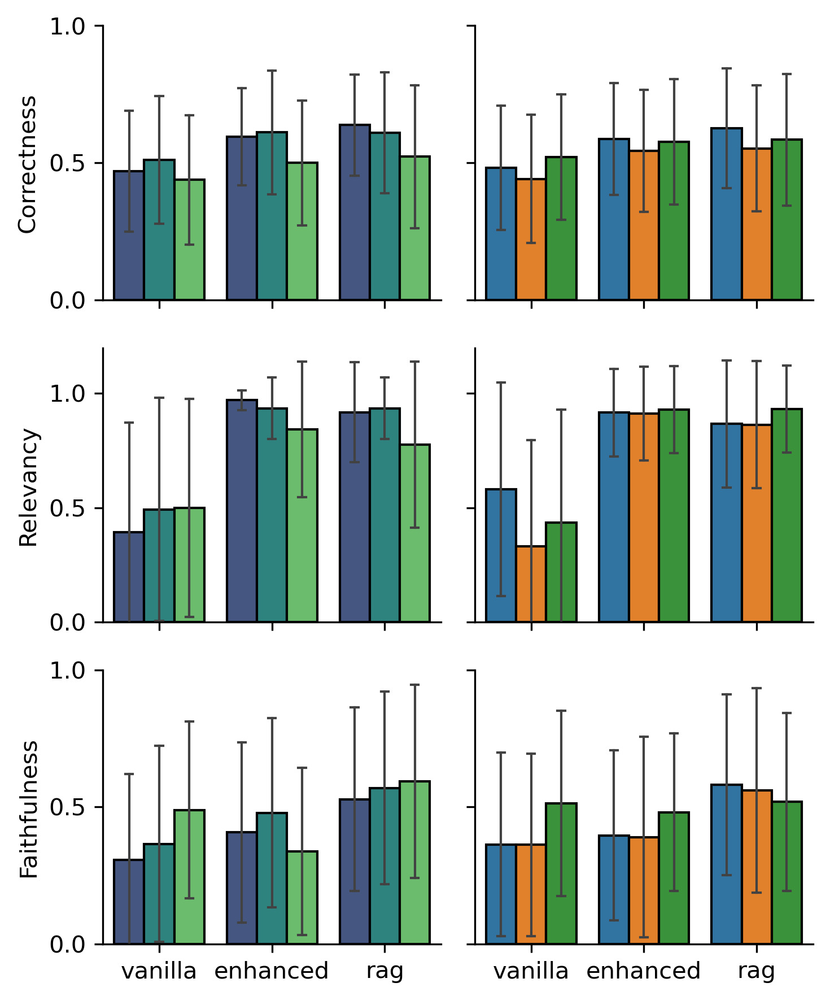

In [70]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is already defined and contains the necessary data

fig, axs = plt.subplots(3, 2, figsize=(5, 6), dpi=300, sharex=True)

# Remove the individual legends from the subplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'viridis',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'tab10',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[1, 0], **barplot_kwargs)
sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
sns.barplot(y='answer_relevancy', ax=axs[1, 1], **barplot_kwargs_2)
sns.barplot(y='answer_correctness', ax=axs[0, 1], **barplot_kwargs_2)

# Set legend = True for the third row plots
barplot_kwargs['legend'] = True
barplot_kwargs_2['legend'] = True

sns.barplot(y='faithfulness', ax=axs[2, 0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[2, 1], **barplot_kwargs_2)

# Create a single figure legend for the entire figure
# Get handles and labels from both 'Question Type' and 'Label'
handles_1, labels_1 = axs[2, 0].get_legend_handles_labels()
handles_2, labels_2 = axs[2, 1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Remove individual subplot legends to avoid overlap
axs[2, 0].legend_.remove()
axs[2, 1].legend_.remove()

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Set y-limits and y-ticks
axs[1, 0].set_ylim([0, 1.2])
axs[1, 1].set_ylim([0, 1.2])
axs[0, 0].set_ylim([0, 1])
axs[0, 1].set_ylim([0, 1])
axs[2, 0].set_ylim([0, 1])
axs[2, 1].set_ylim([0, 1])
axs[0, 0].set_yticks([0, 0.5, 1])
axs[1, 0].set_yticks([0, 0.5, 1])
axs[2, 0].set_yticks([0, 0.5, 1])
axs[0, 1].set_yticks([0, 0.5, 1], labels=[])
axs[1, 1].set_yticks([0, 0.5, 1], labels=[])
axs[2, 1].set_yticks([0, 0.5, 1], labels=[])
axs[0, 1].set_ylabel(None)
axs[1, 1].set_ylabel(None)
axs[2, 1].set_ylabel(None)

axs[1,0].set_ylabel("Relevancy")
axs[0,0].set_ylabel("Correctness")
axs[2,0].set_ylabel("Faithfulness")
axs[2,0].set_xlabel("")
axs[2,1].set_xlabel("")

# Despine and adjust layout
sns.despine()
plt.tight_layout()

# Save the main figure to a PDF
fig.savefig('bmk_main_figure.pdf')

# Now, create a separate figure for the legend
#legend_fig, legend_ax = plt.subplots(figsize=(4, 3), dpi=300)
#legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=10, title="", title_fontsize=12)
#legend_ax.axis('off')  # Hide the axis in the legend figure

# Adjust layout for the legend and save it to a PDF
plt.tight_layout()
# legend_fig.savefig('bmk_legend_figure.pdf')

# Display the figures
plt.show()


# Box Plots from RAGAs

In [48]:
df = pd.read_csv(os.path.join(datapath, "jpic_ragas_9_24_2024.csv"))
df = df.drop_duplicates()
qdf = pd.read_csv(os.path.join(datapath, "machoi_labeled_ds.csv"))
qdf = qdf[['question', 'question type']]
question_types = []
for q in df['question']:
    index = qdf[qdf['question'] == q].index
    q_type = qdf['question type'].iloc[index[0]] if not index.empty else None
    question_types.append(q_type)
df['Question Type'] = question_types
df['Question Type'] = df['Question Type'].replace({
    'simple' : 'Simple',
    'multi_context' : 'Multi-context'
})
df['Parameters'] = df['Parameters'].replace({
    'No DB': 'LLM',
    'RAG, Compression': 'ERAG',
})
df

,Unnamed: 0,question,contexts,answer,ground_truth,answer_relevancy,faithfulness,context_recall,context_precision,answer_correctness,...,Task,Task Time,Input Tokens,Output Tokens,Total Tokens,Task Cost (USD),Total Cost (USD),Prompt,Label,Question Type
0,0,How do B cells undergo affinity maturation dur...,"['""\'Affinity maturation\\\\nThe somatic mutat...","During the germinal center reaction, B cells u...",B cells undergo affinity maturation during the...,0.921092,1.000000,1.0,1.0,0.738314,...,QA,1.820344,146.0,110.0,256.0,0.000238,0.000238,How do B cells undergo affinity maturation dur...,Biology,Simple
1,1,How do B cells undergo affinity maturation dur...,"['""\'Affinity maturation\\\\nThe somatic mutat...","During the germinal center reaction, B cells u...",B cells undergo affinity maturation during the...,0.921092,1.000000,1.0,1.0,0.738314,...,QA,1.820344,146.0,110.0,256.0,0.000238,0.000238,How do B cells undergo affinity maturation dur...,Biology,Simple
2,2,How do B cells undergo affinity maturation dur...,"['""\'Affinity maturation\\\\nThe somatic mutat...","During the germinal center reaction, B cells u...",B cells undergo affinity maturation during the...,0.921092,1.000000,1.0,1.0,0.738314,...,QA,1.820344,146.0,110.0,256.0,0.000238,0.000238,How do B cells undergo affinity maturation dur...,Biology,Simple
3,3,How is the timely clearance of neutrophils cri...,"['""\'and forma phagocytic cup that engulfs ant...","As a bioinformatics chatbot, I can tell you th...",Timely clearance of neutrophils is critical fo...,0.993141,0.272727,0.5,1.0,0.498680,...,QA,1.987282,147.0,135.0,282.0,0.000276,0.000276,How is the timely clearance of neutrophils cri...,Biology,Simple
4,4,How is the timely clearance of neutrophils cri...,"['""\'and forma phagocytic cup that engulfs ant...","As a bioinformatics chatbot, I can tell you th...",Timely clearance of neutrophils is critical fo...,0.993141,0.272727,0.5,1.0,0.498680,...,QA,1.987282,147.0,135.0,282.0,0.000276,0.000276,How is the timely clearance of neutrophils cri...,Biology,Simple
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6625,6625,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,Compression,1.722068,345.0,99.0,444.0,0.000321,0.002902,What causes motor neuron degeneration in ALS a...,Biology,Multi-context
6626,6626,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,Compression,1.722068,345.0,99.0,444.0,0.000321,0.002902,What causes motor neuron degeneration in ALS a...,Biology,Multi-context
6627,6627,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,"QA (RAG, Compression)",2.676114,540.0,166.0,706.0,0.000519,0.002902,What causes motor neuron degeneration in ALS a...,Biology,Multi-context
6628,6628,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,"QA (RAG, Compression)",2.676114,540.0,166.0,706.0,0.000519,0.002902,What causes motor neuron degeneration in ALS a...,Biology,Multi-context


/tmp/ipykernel_1095776/2109147590.py:36: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_1095776/2109147590.py:36: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_1095776/2109147590.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_1095776/2109147590.py:37: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_1095776/2109147590.py:38: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` 

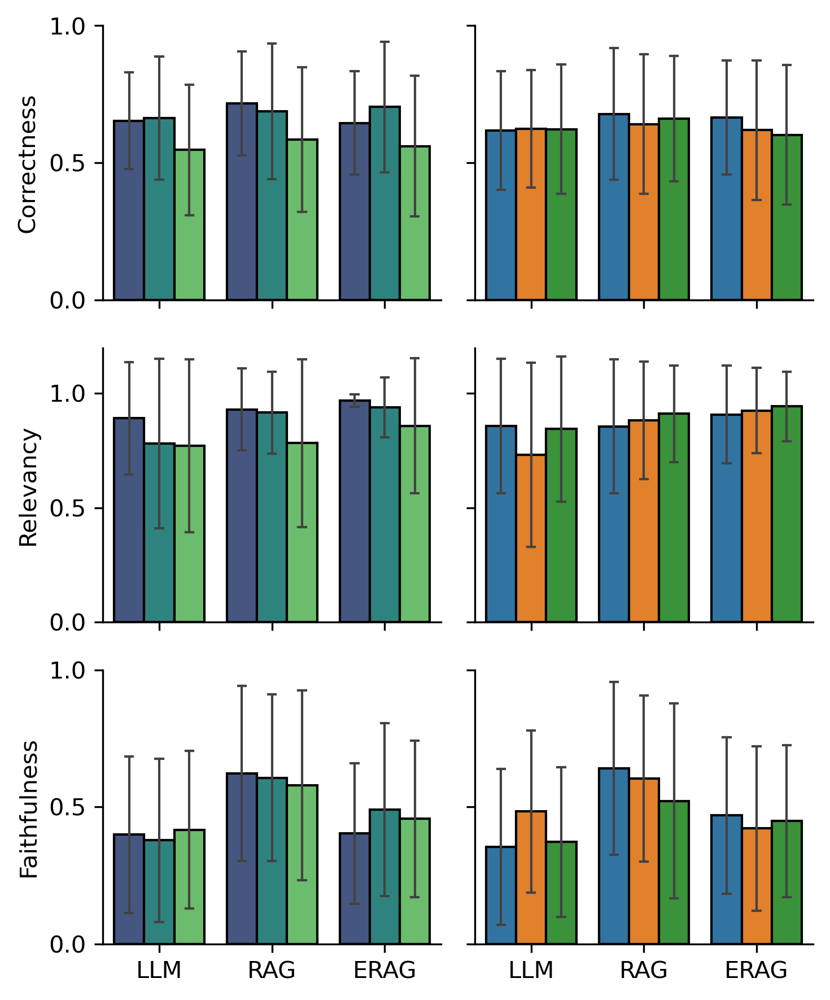

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is already defined and contains the necessary data

fig, axs = plt.subplots(3, 2, figsize=(5, 6), dpi=300, sharex=True)

# Remove the individual legends from the subplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'viridis',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'tab10',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[1, 0], **barplot_kwargs)
sns.barplot(y='answer_correctness', ax=axs[0, 0], **barplot_kwargs)
sns.barplot(y='answer_relevancy', ax=axs[1, 1], **barplot_kwargs_2)
sns.barplot(y='answer_correctness', ax=axs[0, 1], **barplot_kwargs_2)

# Set legend = True for the third row plots
barplot_kwargs['legend'] = True
barplot_kwargs_2['legend'] = True

sns.barplot(y='faithfulness', ax=axs[2, 0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[2, 1], **barplot_kwargs_2)

# Create a single figure legend for the entire figure
# Get handles and labels from both 'Question Type' and 'Label'
handles_1, labels_1 = axs[2, 0].get_legend_handles_labels()
handles_2, labels_2 = axs[2, 1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Remove individual subplot legends to avoid overlap
axs[2, 0].legend_.remove()
axs[2, 1].legend_.remove()

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Set y-limits and y-ticks
axs[1, 0].set_ylim([0, 1.2])
axs[1, 1].set_ylim([0, 1.2])
axs[0, 0].set_ylim([0, 1])
axs[0, 1].set_ylim([0, 1])
axs[2, 0].set_ylim([0, 1])
axs[2, 1].set_ylim([0, 1])
axs[0, 0].set_yticks([0, 0.5, 1])
axs[1, 0].set_yticks([0, 0.5, 1])
axs[2, 0].set_yticks([0, 0.5, 1])
axs[0, 1].set_yticks([0, 0.5, 1], labels=[])
axs[1, 1].set_yticks([0, 0.5, 1], labels=[])
axs[2, 1].set_yticks([0, 0.5, 1], labels=[])
axs[0, 1].set_ylabel(None)
axs[1, 1].set_ylabel(None)
axs[2, 1].set_ylabel(None)

axs[1,0].set_ylabel("Relevancy")
axs[0,0].set_ylabel("Correctness")
axs[2,0].set_ylabel("Faithfulness")
axs[2,0].set_xlabel("")
axs[2,1].set_xlabel("")

# Despine and adjust layout
sns.despine()
plt.tight_layout()

# Save the main figure to a PDF
fig.savefig('bmk_main_figure.pdf')

# Now, create a separate figure for the legend
#legend_fig, legend_ax = plt.subplots(figsize=(4, 3), dpi=300)
#legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=10, title="", title_fontsize=12)
#legend_ax.axis('off')  # Hide the axis in the legend figure

# Adjust layout for the legend and save it to a PDF
plt.tight_layout()
# legend_fig.savefig('bmk_legend_figure.pdf')

# Display the figures
plt.show()


/tmp/ipykernel_4044252/836970474.py:36: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/836970474.py:36: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/836970474.py:37: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/836970474.py:37: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_correctness', ax=axs[1, 0], **barplot_kwargs)
/tmp/ipykernel_4044252/836970474.py:38: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for t

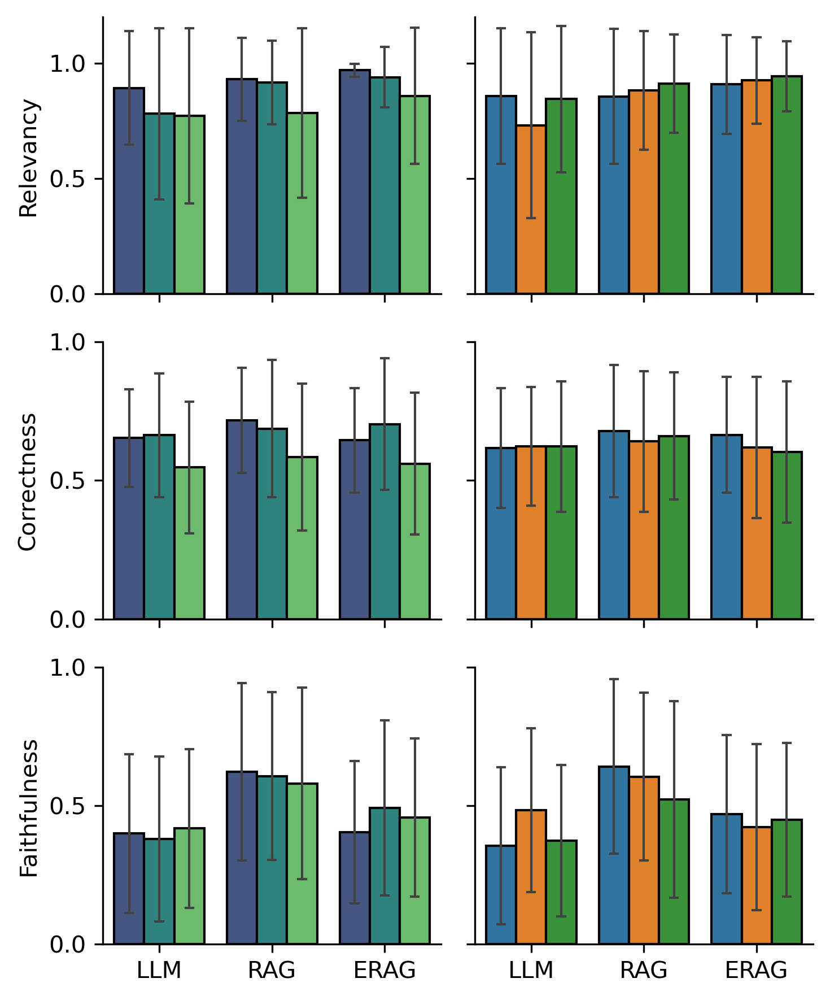

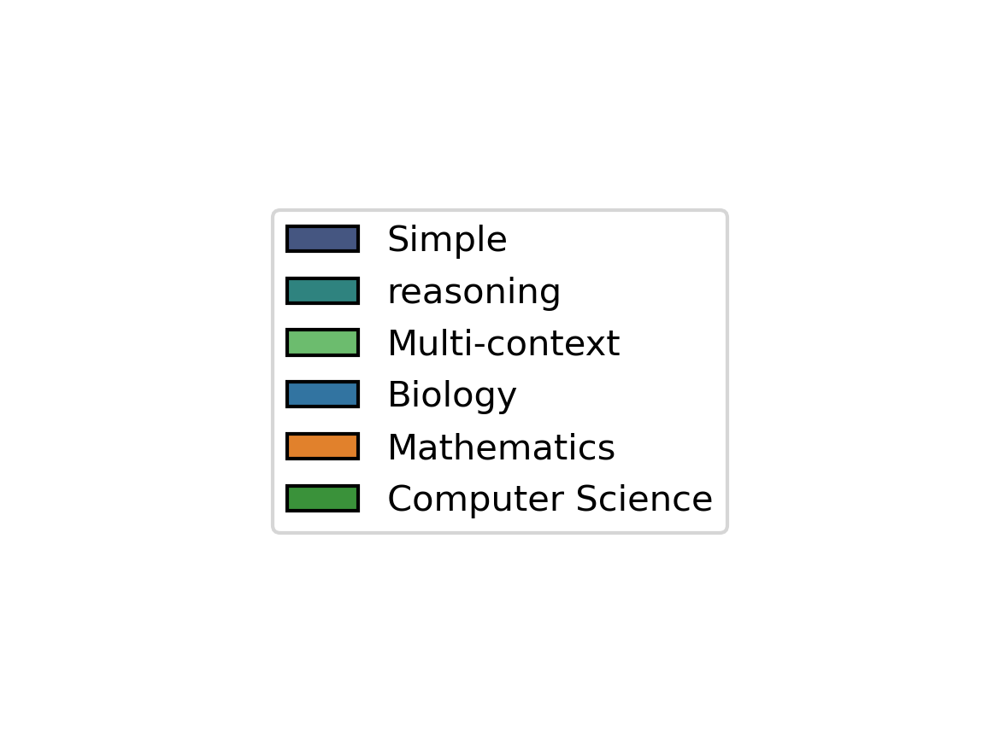

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'df' is already defined and contains the necessary data

fig, axs = plt.subplots(3, 2, figsize=(5, 6), dpi=300, sharex=True)

# Remove the individual legends from the subplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'viridis',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'tab10',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[0, 0], **barplot_kwargs)
sns.barplot(y='answer_correctness', ax=axs[1, 0], **barplot_kwargs)
sns.barplot(y='answer_relevancy', ax=axs[0, 1], **barplot_kwargs_2)
sns.barplot(y='answer_correctness', ax=axs[1, 1], **barplot_kwargs_2)

# Set legend = True for the third row plots
barplot_kwargs['legend'] = True
barplot_kwargs_2['legend'] = True

sns.barplot(y='faithfulness', ax=axs[2, 0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[2, 1], **barplot_kwargs_2)

# Create a single figure legend for the entire figure
# Get handles and labels from both 'Question Type' and 'Label'
handles_1, labels_1 = axs[2, 0].get_legend_handles_labels()
handles_2, labels_2 = axs[2, 1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Remove individual subplot legends to avoid overlap
axs[2, 0].legend_.remove()
axs[2, 1].legend_.remove()

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Set y-limits and y-ticks
axs[0, 0].set_ylim([0, 1.2])
axs[0, 1].set_ylim([0, 1.2])
axs[1, 0].set_ylim([0, 1])
axs[1, 1].set_ylim([0, 1])
axs[2, 0].set_ylim([0, 1])
axs[2, 1].set_ylim([0, 1])
axs[0, 0].set_yticks([0, 0.5, 1])
axs[1, 0].set_yticks([0, 0.5, 1])
axs[2, 0].set_yticks([0, 0.5, 1])
axs[0, 1].set_yticks([0, 0.5, 1], labels=[])
axs[1, 1].set_yticks([0, 0.5, 1], labels=[])
axs[2, 1].set_yticks([0, 0.5, 1], labels=[])
axs[0, 1].set_ylabel(None)
axs[1, 1].set_ylabel(None)
axs[2, 1].set_ylabel(None)

axs[0,0].set_ylabel("Relevancy")
axs[1,0].set_ylabel("Correctness")
axs[2,0].set_ylabel("Faithfulness")
axs[2,0].set_xlabel("")
axs[2,1].set_xlabel("")

# Despine and adjust layout
sns.despine()
plt.tight_layout()

# Save the main figure to a PDF
fig.savefig('bmk_main_figure.pdf')

# Now, create a separate figure for the legend
legend_fig, legend_ax = plt.subplots(figsize=(4, 3), dpi=300)
legend_ax.legend(handles=handles, labels=labels, loc='center', fontsize=10, title="", title_fontsize=12)
legend_ax.axis('off')  # Hide the axis in the legend figure

# Adjust layout for the legend and save it to a PDF
plt.tight_layout()
legend_fig.savefig('bmk_legend_figure.pdf')

# Display the figures
plt.show()


/tmp/ipykernel_4044252/1062853614.py:31: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
/tmp/ipykernel_4044252/1062853614.py:31: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
/tmp/ipykernel_4044252/1062853614.py:32: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1,0], **barplot_kwargs)
/tmp/ipykernel_4044252/1062853614.py:32: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_correctness', ax=axs[1,0], **barplot_kwargs)
/tmp/ipykernel_4044252/1062853614.py:34: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for 

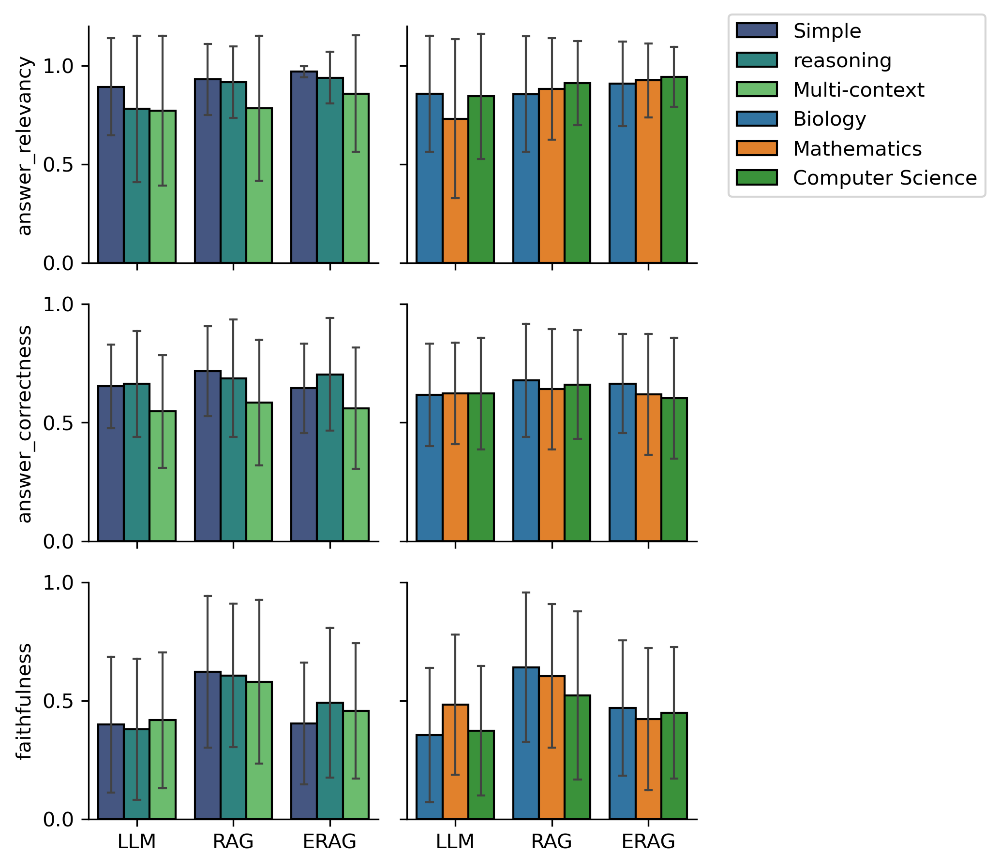

In [23]:
fig, axs = plt.subplots(3,2, figsize=(5, 6), dpi=300, sharex=True)

# Remove the individual legends from the subplots by setting 'legend=False' in both barplot_kwargs dictionaries
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'viridis',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'tab10',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False,  # Remove legend from the subplot,
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
sns.barplot(y='answer_correctness', ax=axs[1,0], **barplot_kwargs)

sns.barplot(y='answer_relevancy', ax=axs[0,1], **barplot_kwargs_2)
sns.barplot(y='answer_correctness', ax=axs[1,1], **barplot_kwargs_2)

barplot_kwargs['legend'] = True
barplot_kwargs_2['legend'] = True
sns.barplot(y='faithfulness', ax=axs[2,0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[2,1], **barplot_kwargs_2)

# Create a single legend for the entire figure
# Get the handles and labels for both 'Question Type' and 'Label' from the bar plots
handles_1, labels_1 = axs[2,0].get_legend_handles_labels()
handles_2, labels_2 = axs[2,1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Create the single legend
fig.legend(handles, labels, loc='upper left', bbox_to_anchor=(1, 1), ncol=1, fontsize=10, title="", title_fontsize=12)

# Adjust the layout to make space for the legend
plt.subplots_adjust(right=0.8)  # Make space on the right side for the legend

axs[2,0].legend_.remove()
axs[2,1].legend_.remove()
axs[2,0].set_xlabel('')
axs[2,1].set_xlabel('')

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# plt.ylim([0,1])
axs[0,0].set_ylim([0,1.2])
axs[0,1].set_ylim([0,1.2])
axs[1,0].set_ylim([0,1])
axs[1,1].set_ylim([0,1])
axs[2,0].set_ylim([0,1])
axs[2,1].set_ylim([0,1])
axs[0,0].set_yticks([0, 0.5, 1])
axs[1,0].set_yticks([0, 0.5, 1])
axs[2,0].set_yticks([0, 0.5, 1])
axs[0,1].set_yticks([0, 0.5, 1], labels=[])
axs[1,1].set_yticks([0, 0.5, 1], labels=[])
axs[2,1].set_yticks([0, 0.5, 1], labels=[])
axs[0,1].set_ylabel(None)
axs[1,1].set_ylabel(None)
axs[2,1].set_ylabel(None)

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()



In [21]:
help(ax.set_yticks)

Help on method set_yticks in module matplotlib.axes._base:

set_yticks(ticks, labels=None, *, minor=False, **kwargs) method of matplotlib.axes._axes.Axes instance
    Set the yaxis' tick locations and optionally tick labels.
    
    If necessary, the view limits of the Axis are expanded so that all
    given ticks are visible.
    
    Parameters
    ----------
    ticks : 1D array-like
        Array of tick locations.  The axis `.Locator` is replaced by a
        `~.ticker.FixedLocator`.
    
        The values may be either floats or in axis units.
    
        Pass an empty list to remove all ticks::
    
            set_yticks([])
    
        Some tick formatters will not label arbitrary tick positions;
        e.g. log formatters only label decade ticks by default. In
        such a case you can set a formatter explicitly on the axis
        using `.Axis.set_major_formatter` or provide formatted
        *labels* yourself.
    labels : list of str, optional
        Tick labels fo

/tmp/ipykernel_3823768/2677090764.py:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
/tmp/ipykernel_3823768/2677090764.py:17: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
/tmp/ipykernel_3823768/2677090764.py:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1,0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/2677090764.py:22: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 1}` instead.

  sns.barplot(y='answer_correctness', ax=axs[1,0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/2677090764.py:27: FutureWarning: 

The `ci` parameter is deprecat

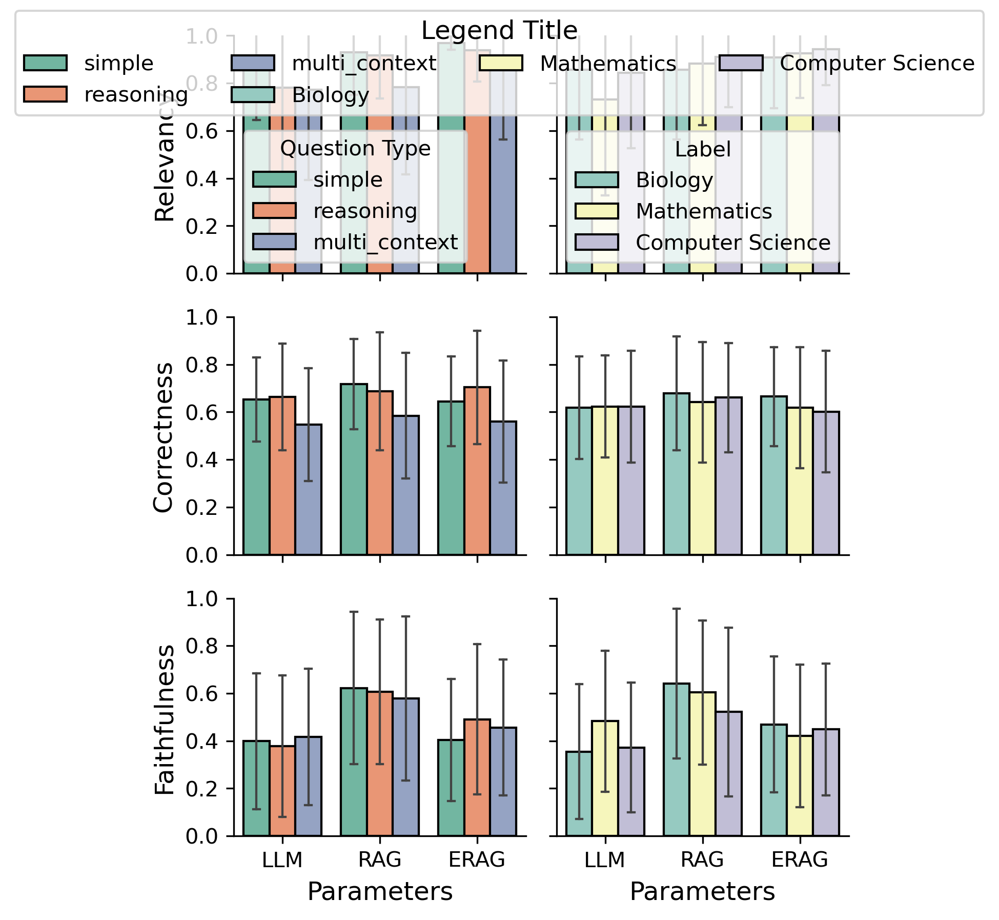

In [211]:
fig, axs = plt.subplots(3,2, figsize=(5, 6), dpi=300, sharey=True, sharex=True)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2  # Add caps to the error bars
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
axs[0,0].set_ylabel('Relevancy', fontsize=12)
axs[0,0].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1,0], legend=False, **barplot_kwargs)
axs[1,0].set_ylabel('Correctness', fontsize=12)
axs[1,0].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[2,0], legend=False, **barplot_kwargs)
axs[2,0].set_ylabel('Faithfulness', fontsize=12)
axs[2,0].set_xlabel('', fontsize=12)

# Define common properties for the second set of barplots
barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set3',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2  # Add caps to the error bars
}

# Plot 1: Answer Relevancy (second column)
sns.barplot(y='answer_relevancy', ax=axs[0,1], **barplot_kwargs_2)
axs[0,1].set_ylabel('Relevancy', fontsize=12)
axs[0,1].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness (second column)
sns.barplot(y='answer_correctness', ax=axs[1,1], legend=False, **barplot_kwargs_2)
axs[1,1].set_ylabel('Correctness', fontsize=12)
axs[1,1].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness (second column)
sns.barplot(y='faithfulness', ax=axs[2,1], legend=False, **barplot_kwargs_2)
axs[2,1].set_ylabel('Faithfulness', fontsize=12)
axs[2,1].set_xlabel('', fontsize=12)

# Remove the individual legends from the subplots by setting 'legend=False' in both barplot_kwargs dictionaries
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

barplot_kwargs_2 = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set3',  # Use a more visually distinct color palette
    'errwidth': 1,  # Thin error bars
    'capsize': 0.2,  # Add caps to the error bars
    'legend': False  # Remove legend from the subplot
}

# Create your subplots (without legends)
sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
sns.barplot(y='answer_correctness', ax=axs[1,0], **barplot_kwargs)
sns.barplot(y='faithfulness', ax=axs[2,0], **barplot_kwargs)

sns.barplot(y='answer_relevancy', ax=axs[0,1], **barplot_kwargs_2)
sns.barplot(y='answer_correctness', ax=axs[1,1], **barplot_kwargs_2)
sns.barplot(y='faithfulness', ax=axs[2,1], **barplot_kwargs_2)

# Create a single legend for the entire figure
# Get the handles and labels for both 'Question Type' and 'Label' from the bar plots
handles_1, labels_1 = axs[0,0].get_legend_handles_labels()
handles_2, labels_2 = axs[0,1].get_legend_handles_labels()

# Combine handles and labels from both legends
handles = handles_1 + handles_2
labels = labels_1 + labels_2

# Create the single legend
fig.legend(handles, labels, loc='upper center', ncol=4, fontsize=10, title="Legend Title", title_fontsize=12)

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

plt.ylim([0,1])

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_3823768/662296300.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
/tmp/ipykernel_3823768/662296300.py:21: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1,0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/662296300.py:26: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='faithfulness', ax=axs[2,0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/662296300.py:42: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0,1], **barplot_kwargs)
/tmp/ipykernel_3823768/662296300.py:48: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=

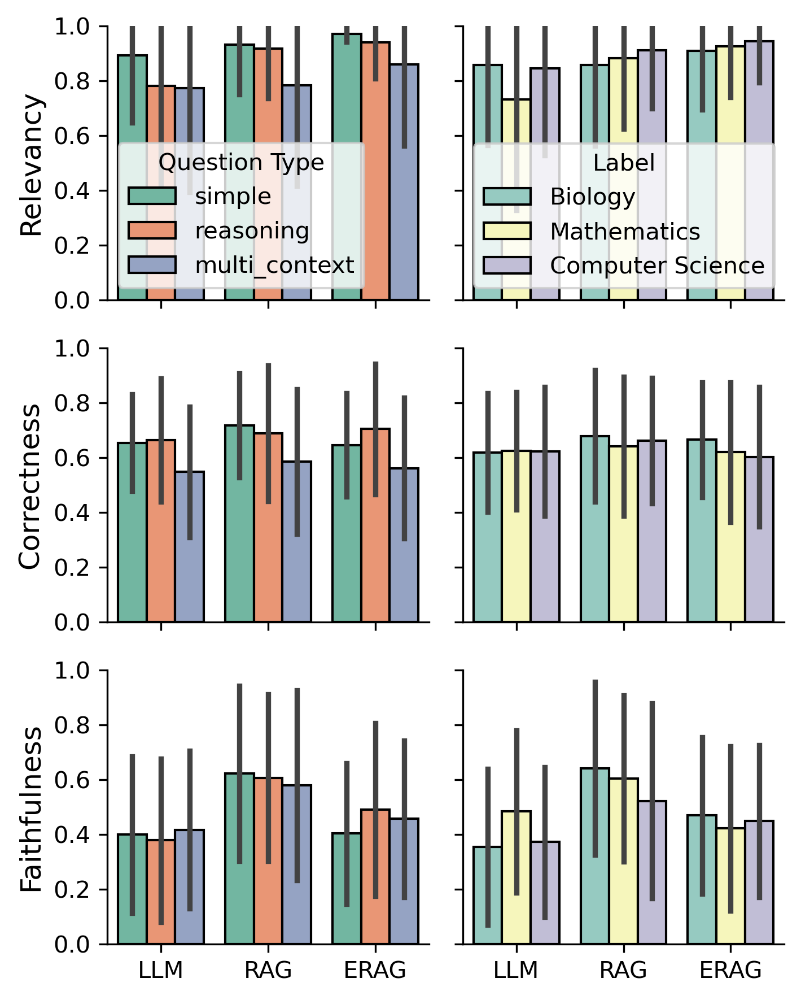

In [207]:
# Create the figure and axes
fig, axs = plt.subplots(3,2, figsize=(5, 6), dpi=300, sharey=True, sharex=True)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0,0], **barplot_kwargs)
axs[0,0].set_ylabel('Relevancy', fontsize=12)
axs[0,0].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1,0], legend=False, **barplot_kwargs)
axs[1,0].set_ylabel('Correctness', fontsize=12)
axs[1,0].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[2,0], legend=False, **barplot_kwargs)
axs[2,0].set_ylabel('Faithfulness', fontsize=12)
axs[2,0].set_xlabel('', fontsize=12)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set3'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0,1], **barplot_kwargs)
# ax0,s,0].set_title('Answer Relevancy', fontsize=14)
axs[0,1].set_ylabel('Relevancy', fontsize=12)
axs[0,1].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1,1], legend=False, **barplot_kwargs)
axs[1,1].set_ylabel('Correctness', fontsize=12)
axs[1,1].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[2,1], legend=False, **barplot_kwargs)
axs[2,1].set_ylabel('Faithfulness', fontsize=12)
axs[2,1].set_xlabel('', fontsize=12)

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Adjust the legend for the third plot
# handles, labels = axs[2].get_legend_handles_labels()
# axs[2].legend(handles=handles, labels=labels, title='Question Type', loc='upper right', fontsize=10, title_fontsize=12)

plt.ylim([0,1])

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_3823768/3186982512.py:16: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0,0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/3186982512.py:22: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[0,1], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/3186982512.py:28: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='faithfulness', ax=axs[0,2], **barplot_kwargs)
/tmp/ipykernel_3823768/3186982512.py:45: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[1,0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/3186982512.py:51: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answe

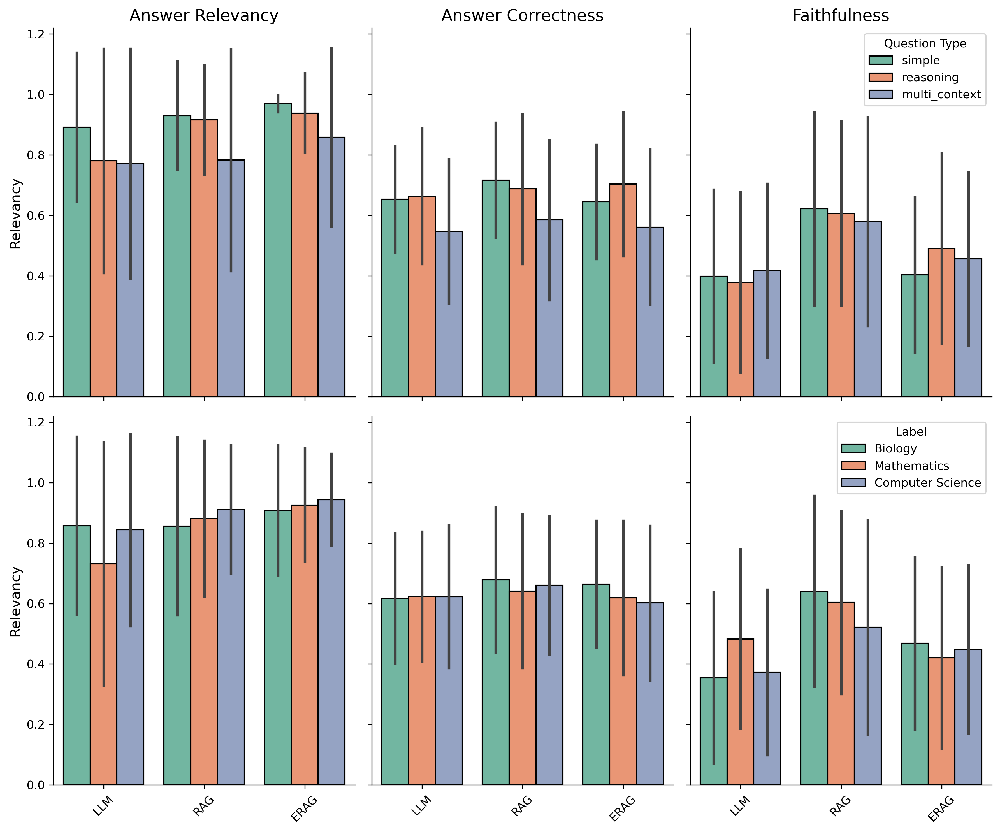

In [200]:
# Create the figure and axes
fig, axs = plt.subplots(2, 3, figsize=(12, 10), dpi=300, sharey=True, sharex=True)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0,0], legend=False, **barplot_kwargs)
axs[0,0].set_title('Answer Relevancy', fontsize=14)
axs[0,0].set_ylabel('Relevancy', fontsize=12)
axs[0,0].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[0,1], legend=False, **barplot_kwargs)
axs[0,1].set_title('Answer Correctness', fontsize=14)
axs[0,1].set_ylabel('Correctness', fontsize=12)
axs[0,1].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[0,2], **barplot_kwargs)
axs[0,2].set_title('Faithfulness', fontsize=14)
axs[0,2].set_ylabel('Faithfulness', fontsize=12)
axs[0,2].set_xlabel('', fontsize=12)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[1,0], legend=False, **barplot_kwargs)
# axs[1,0].set_title('Answer Relevancy', fontsize=14)
axs[1,0].set_ylabel('Relevancy', fontsize=12)
axs[1,0].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1,1], legend=False, **barplot_kwargs)
axs[1,1].set_ylabel('Correctness', fontsize=12)
axs[1,1].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[1,2], **barplot_kwargs)
axs[1,2].set_ylabel('Faithfulness', fontsize=12)
axs[1,2].set_xlabel('', fontsize=12)

# Customize tick parameters for all plots
for ax in axs.flatten():
    ax.tick_params(axis='x', rotation=45, labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Adjust the legend for the third plot
# handles, labels = axs[2].get_legend_handles_labels()
# axs[2].legend(handles=handles, labels=labels, title='Question Type', loc='upper right', fontsize=10, title_fontsize=12)

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_3823768/1569836048.py:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/1569836048.py:25: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/1569836048.py:31: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='faithfulness', ax=axs[2], **barplot_kwargs)


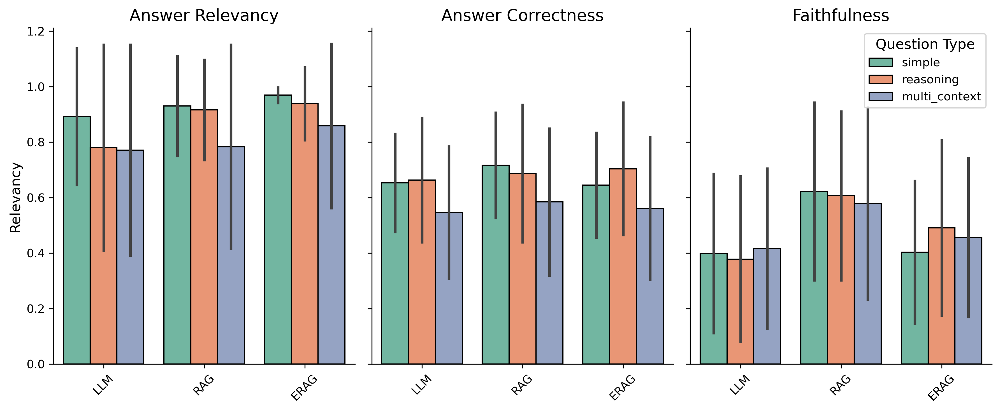

In [195]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the figure and axes
fig, axs = plt.subplots(1, 3, figsize=(12, 5), dpi=300, sharey=True)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0], legend=False, **barplot_kwargs)
axs[0].set_title('Answer Relevancy', fontsize=14)
axs[0].set_ylabel('Relevancy', fontsize=12)
axs[0].set_xlabel('', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1], legend=False, **barplot_kwargs)
axs[1].set_title('Answer Correctness', fontsize=14)
axs[1].set_ylabel('Correctness', fontsize=12)
axs[1].set_xlabel('', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[2], **barplot_kwargs)
axs[2].set_title('Faithfulness', fontsize=14)
axs[2].set_ylabel('Faithfulness', fontsize=12)
axs[2].set_xlabel('', fontsize=12)

# Customize tick parameters for all plots
for ax in axs:
    ax.tick_params(axis='x', rotation=45, labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Adjust the legend for the third plot
handles, labels = axs[2].get_legend_handles_labels()
axs[2].legend(handles=handles, labels=labels, title='Question Type', loc='upper right', fontsize=10, title_fontsize=12)

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()


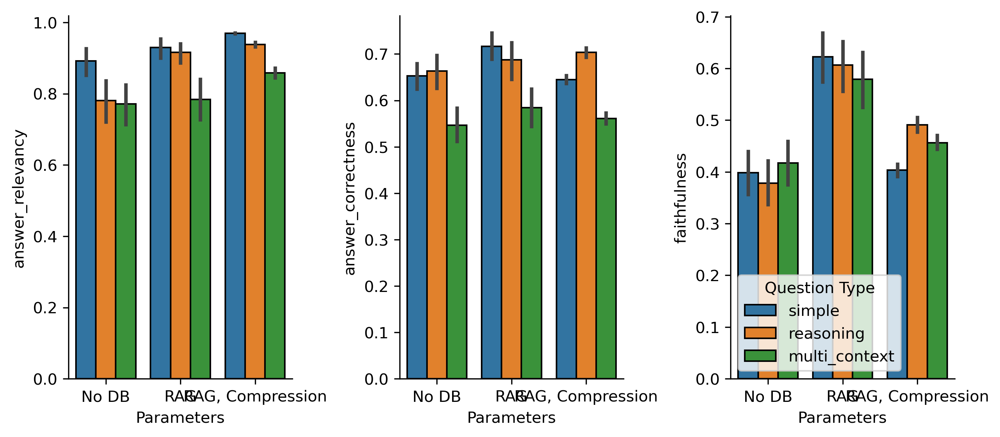

In [177]:
fig, axs = plt.subplots(1,3,figsize=(9, 4), dpi=300)

sns.barplot(
    data=df,
    x='Parameters',
    y='answer_relevancy',
    ax=axs[0],
    hue='Question Type',
    legend=False,
    edgecolor='k'
)
sns.barplot(
    data=df,
    x='Parameters',
    y='answer_correctness',
    ax=axs[1],
    hue='Question Type',
    legend=False,
    edgecolor='k'
)
sns.barplot(
    data=df,
    x='Parameters',
    y='faithfulness',
    ax=axs[2],
    hue='Question Type',
    legend=True,
    edgecolor='k'
)
sns.despine()
plt.tight_layout()


/tmp/ipykernel_3823768/314911661.py:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/314911661.py:25: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1], legend=False, **barplot_kwargs)
/tmp/ipykernel_3823768/314911661.py:31: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='faithfulness', ax=axs[2], **barplot_kwargs)


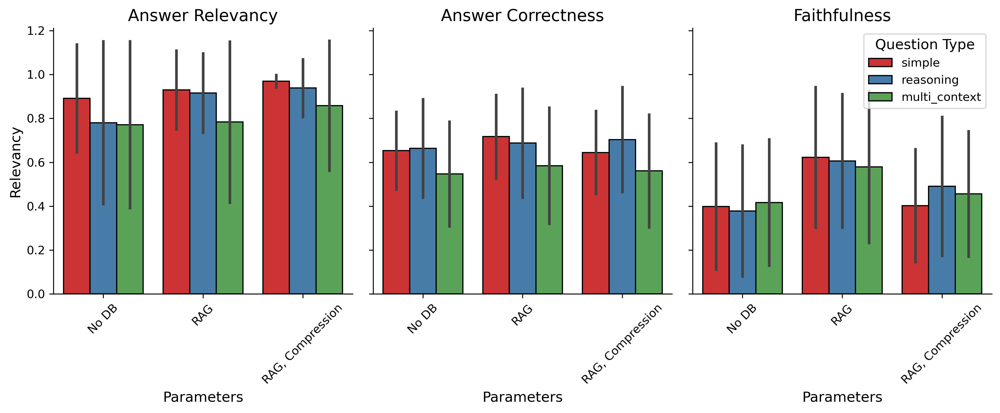

In [183]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the figure and axes
fig, axs = plt.subplots(1, 3, figsize=(12, 5), dpi=300, sharey=True)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Question Type',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set1'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0], legend=False, **barplot_kwargs)
axs[0].set_title('Answer Relevancy', fontsize=14)
axs[0].set_ylabel('Relevancy', fontsize=12)
axs[0].set_xlabel('Parameters', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1], legend=False, **barplot_kwargs)
axs[1].set_title('Answer Correctness', fontsize=14)
axs[1].set_ylabel('Correctness', fontsize=12)
axs[1].set_xlabel('Parameters', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[2], **barplot_kwargs)
axs[2].set_title('Faithfulness', fontsize=14)
axs[2].set_ylabel('Faithfulness', fontsize=12)
axs[2].set_xlabel('Parameters', fontsize=12)

# Customize tick parameters for all plots
for ax in axs:
    ax.tick_params(axis='x', rotation=45, labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Adjust the legend for the third plot
handles, labels = axs[2].get_legend_handles_labels()
axs[2].legend(handles=handles, labels=labels, title='Question Type', loc='upper right', fontsize=10, title_fontsize=12)

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()


/tmp/ipykernel_3823768/98466833.py:19: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_relevancy', ax=axs[0], **barplot_kwargs)
/tmp/ipykernel_3823768/98466833.py:25: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='answer_correctness', ax=axs[1], **barplot_kwargs)
/tmp/ipykernel_3823768/98466833.py:31: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(y='faithfulness', ax=axs[2], **barplot_kwargs)


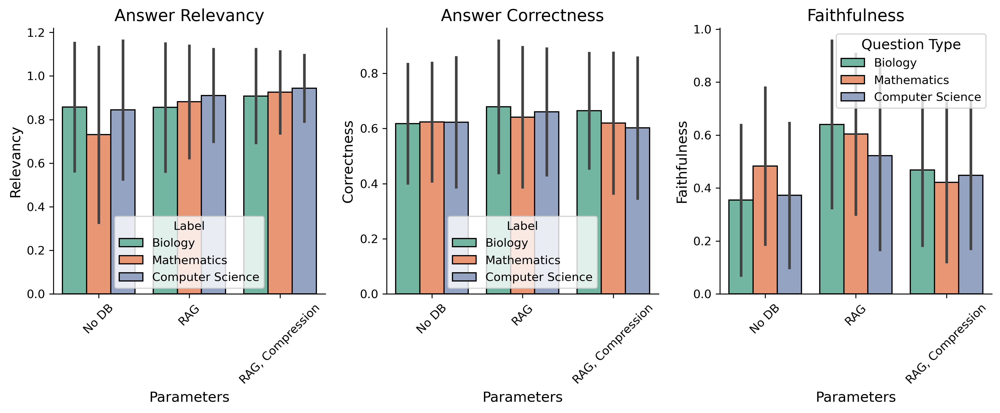

In [180]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create the figure and axes
fig, axs = plt.subplots(1, 3, figsize=(12, 5), dpi=300)

# Define common properties for all barplots
barplot_kwargs = {
    'data': df,
    'x': 'Parameters',
    'hue': 'Label',
    'edgecolor': 'k',
    'linewidth': 1,
    'ci': 'sd',  # Standard deviation bars
    'palette': 'Set2'  # Use a more visually distinct color palette
}

# Plot 1: Answer Relevancy
sns.barplot(y='answer_relevancy', ax=axs[0], **barplot_kwargs)
axs[0].set_title('Answer Relevancy', fontsize=14)
axs[0].set_ylabel('Relevancy', fontsize=12)
axs[0].set_xlabel('Parameters', fontsize=12)

# Plot 2: Answer Correctness
sns.barplot(y='answer_correctness', ax=axs[1], **barplot_kwargs)
axs[1].set_title('Answer Correctness', fontsize=14)
axs[1].set_ylabel('Correctness', fontsize=12)
axs[1].set_xlabel('Parameters', fontsize=12)

# Plot 3: Faithfulness
sns.barplot(y='faithfulness', ax=axs[2], **barplot_kwargs)
axs[2].set_title('Faithfulness', fontsize=14)
axs[2].set_ylabel('Faithfulness', fontsize=12)
axs[2].set_xlabel('Parameters', fontsize=12)

# Customize tick parameters for all plots
for ax in axs:
    ax.tick_params(axis='x', rotation=45, labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

# Adjust the legend for the third plot
handles, labels = axs[2].get_legend_handles_labels()
axs[2].legend(handles=handles, labels=labels, title='Question Type', loc='upper right', fontsize=10, title_fontsize=12)

# Despine and tighten layout
sns.despine()
plt.tight_layout()

# Show the plot
plt.show()


In [179]:
df

,Unnamed: 0,question,contexts,answer,ground_truth,answer_relevancy,faithfulness,context_recall,context_precision,answer_correctness,...,Task,Task Time,Input Tokens,Output Tokens,Total Tokens,Task Cost (USD),Total Cost (USD),Prompt,Label,Question Type
0,0,How do B cells undergo affinity maturation dur...,"['""\'Affinity maturation\\\\nThe somatic mutat...","During the germinal center reaction, B cells u...",B cells undergo affinity maturation during the...,0.921092,1.000000,1.0,1.0,0.738314,...,QA,1.820344,146.0,110.0,256.0,0.000238,0.000238,How do B cells undergo affinity maturation dur...,Biology,simple
1,1,How do B cells undergo affinity maturation dur...,"['""\'Affinity maturation\\\\nThe somatic mutat...","During the germinal center reaction, B cells u...",B cells undergo affinity maturation during the...,0.921092,1.000000,1.0,1.0,0.738314,...,QA,1.820344,146.0,110.0,256.0,0.000238,0.000238,How do B cells undergo affinity maturation dur...,Biology,simple
2,2,How do B cells undergo affinity maturation dur...,"['""\'Affinity maturation\\\\nThe somatic mutat...","During the germinal center reaction, B cells u...",B cells undergo affinity maturation during the...,0.921092,1.000000,1.0,1.0,0.738314,...,QA,1.820344,146.0,110.0,256.0,0.000238,0.000238,How do B cells undergo affinity maturation dur...,Biology,simple
3,3,How is the timely clearance of neutrophils cri...,"['""\'and forma phagocytic cup that engulfs ant...","As a bioinformatics chatbot, I can tell you th...",Timely clearance of neutrophils is critical fo...,0.993141,0.272727,0.5,1.0,0.498680,...,QA,1.987282,147.0,135.0,282.0,0.000276,0.000276,How is the timely clearance of neutrophils cri...,Biology,simple
4,4,How is the timely clearance of neutrophils cri...,"['""\'and forma phagocytic cup that engulfs ant...","As a bioinformatics chatbot, I can tell you th...",Timely clearance of neutrophils is critical fo...,0.993141,0.272727,0.5,1.0,0.498680,...,QA,1.987282,147.0,135.0,282.0,0.000276,0.000276,How is the timely clearance of neutrophils cri...,Biology,simple
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6625,6625,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,Compression,1.722068,345.0,99.0,444.0,0.000321,0.002902,What causes motor neuron degeneration in ALS a...,Biology,multi_context
6626,6626,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,Compression,1.722068,345.0,99.0,444.0,0.000321,0.002902,What causes motor neuron degeneration in ALS a...,Biology,multi_context
6627,6627,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,"QA (RAG, Compression)",2.676114,540.0,166.0,706.0,0.000519,0.002902,What causes motor neuron degeneration in ALS a...,Biology,multi_context
6628,6628,What causes motor neuron degeneration in ALS a...,"['""\'HUMAN GENOMICS\\\\nSpatiotemporal dynamic...",Motor neuron degeneration in ALS is caused by ...,Motor neuron degeneration in ALS results in pa...,0.935136,0.100000,1.0,1.0,0.349044,...,"QA (RAG, Compression)",2.676114,540.0,166.0,706.0,0.000519,0.002902,What causes motor neuron degeneration in ALS a...,Biology,multi_context


# Histograms for varying number of documents retrieved

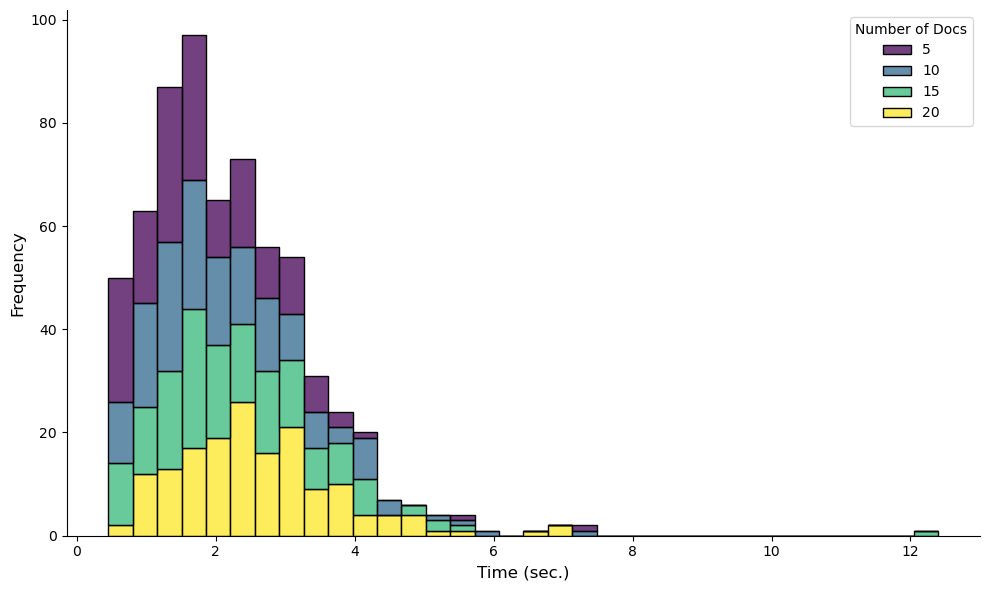

In [107]:
df = pd.read_csv(os.path.join(datapath, "doc_times.csv"))

plt.figure(figsize=(10, 6))  # Adjust the figure size
sns.histplot(data=df,
             x='time',
             hue='Number of Docs',
             palette='viridis',  # Use the Viridis color palette
             multiple='stack')  # Ensures a stacked histogram for better readability

# Despine the plot
sns.despine()

# Customize the axis labels
plt.xlabel("Time (sec.)", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


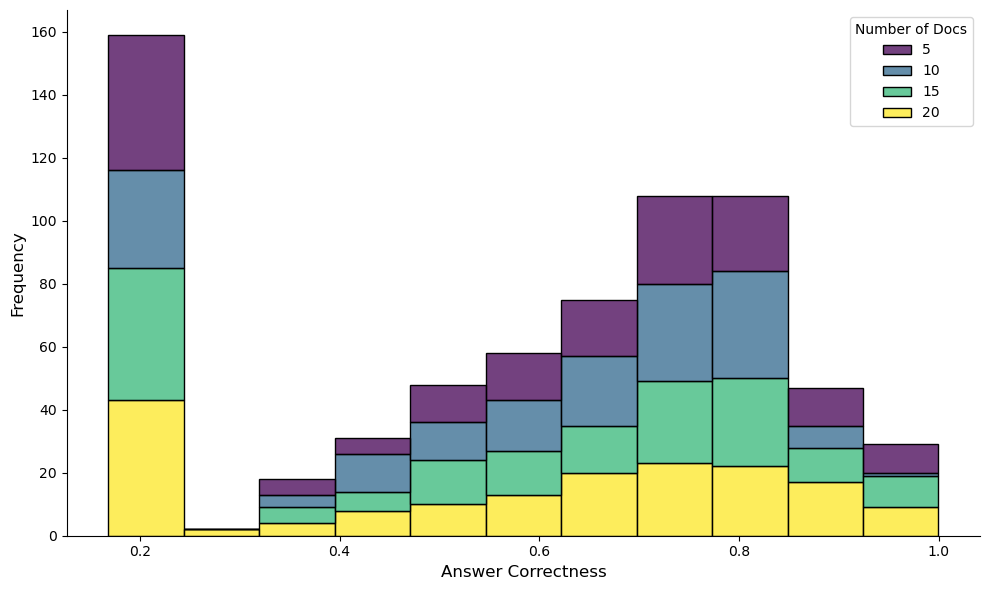

In [108]:
df = pd.read_csv(os.path.join(datapath, "doc_scores.csv"))

plt.figure(figsize=(10, 6))  # Adjust the figure size
sns.histplot(data=df,
             x='answer_correctness',
             hue='Number of Docs',
             palette='viridis',  # Use the Viridis color palette
             multiple='stack')  # Ensures a stacked histogram for better readability

# Despine the plot
sns.despine()

# Customize the axis labels
plt.xlabel("Answer Correctness", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()
